# Import of libraries.

In [1]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import numpy as np
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf

warnings.filterwarnings("ignore")
pd.options.display.max_columns = None

# Scraping data from Basketball Reference.

We're interested in statistics from every game LeBron James has played in during regular season from his rookie season. We should scrape the data from the biggest and the most respected basketball data website.

In [2]:
all_seasons_data = []

for season in range(2004, 2025):
    url = f'https://www.basketball-reference.com/players/j/jamesle01/gamelog/{season}/'
    response = requests.get(url)
    if response.status_code == 200:
        soup = BeautifulSoup(response.text, 'html.parser')
        table = soup.find('table', {'id': 'pgl_basic'})
        df = pd.read_html(str(table))[0]
        df['Season'] = season
        all_seasons_data.append(df)

Now we transform scraped data into data frame.

In [3]:
df = pd.concat(all_seasons_data, ignore_index=True)
df

,Rk,G,Date,Age,Tm,Unnamed: 5,Opp,Unnamed: 7,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,Season
0,1,1,2003-10-29,18-303,CLE,@,SAC,L (-14),1,42:50,12,20,.600,0,2,.000,1,3,.333,2,4,6,9,4,0,2,3,25,24.7,-9,2004
1,2,2,2003-10-30,18-304,CLE,@,PHO,L (-9),1,40:21,8,17,.471,1,5,.200,4,7,.571,2,10,12,8,1,0,7,1,21,14.7,-3,2004
2,3,3,2003-11-01,18-306,CLE,@,POR,L (-19),1,39:10,3,12,.250,0,1,.000,2,2,1.000,0,4,4,6,2,0,2,3,8,5.0,-21,2004
3,4,4,2003-11-05,18-310,CLE,NaN,DEN,L (-4),1,41:06,3,11,.273,0,2,.000,1,1,1.000,2,9,11,7,2,3,2,1,7,11.2,-3,2004
4,5,5,2003-11-07,18-312,CLE,@,IND,L (-1),1,43:44,8,18,.444,1,2,.500,6,7,.857,0,5,5,3,0,0,7,2,23,9.0,-7,2004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1681,2,2,2023-10-26,38-300,LAL,NaN,PHO,W (+5),1,35:00,7,14,0.5,1,5,0.2,6,8,0.75,1,7,8,9,2,2,5,1,21,20.3,22,2024
1682,3,3,2023-10-29,38-303,LAL,@,SAC,L (-5),1,39:05,11,19,0.579,3,8,0.375,2,6,0.333,0,15,15,8,0,0,8,2,27,17.8,-5,2024
1683,4,4,2023-10-30,38-304,LAL,NaN,ORL,W (+3),1,32:47,7,17,0.412,2,6,0.333,3,4,0.75,0,3,3,4,3,1,5,0,19,11.9,5,2024
1684,5,5,2023-11-01,38-306,LAL,NaN,LAC,W (+5),1,42:29,13,19,0.684,4,8,0.5,5,10,0.5,0,12,12,7,1,2,4,3,35,30.6,6,2024


Data aren't perfectly downloaded, some of the column names appear in the set as the records. A key to delete them is to find the records where the cell content equals the column name.

In [4]:
df[df['Rk']=='Rk']

,Rk,G,Date,Age,Tm,Unnamed: 5,Opp,Unnamed: 7,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,Season
20,Rk,G,Date,Age,Tm,NaN,Opp,NaN,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,2004
41,Rk,G,Date,Age,Tm,NaN,Opp,NaN,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,2004
62,Rk,G,Date,Age,Tm,NaN,Opp,NaN,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,2004
83,Rk,G,Date,Age,Tm,NaN,Opp,NaN,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,2004
106,Rk,G,Date,Age,Tm,NaN,Opp,NaN,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,2005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1591,Rk,G,Date,Age,Tm,NaN,Opp,NaN,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,2022
1614,Rk,G,Date,Age,Tm,NaN,Opp,NaN,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,2023
1635,Rk,G,Date,Age,Tm,NaN,Opp,NaN,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,2023
1656,Rk,G,Date,Age,Tm,NaN,Opp,NaN,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,2023


In [5]:
df = df[df['Rk']!='Rk']
df

,Rk,G,Date,Age,Tm,Unnamed: 5,Opp,Unnamed: 7,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,Season
0,1,1,2003-10-29,18-303,CLE,@,SAC,L (-14),1,42:50,12,20,.600,0,2,.000,1,3,.333,2,4,6,9,4,0,2,3,25,24.7,-9,2004
1,2,2,2003-10-30,18-304,CLE,@,PHO,L (-9),1,40:21,8,17,.471,1,5,.200,4,7,.571,2,10,12,8,1,0,7,1,21,14.7,-3,2004
2,3,3,2003-11-01,18-306,CLE,@,POR,L (-19),1,39:10,3,12,.250,0,1,.000,2,2,1.000,0,4,4,6,2,0,2,3,8,5.0,-21,2004
3,4,4,2003-11-05,18-310,CLE,NaN,DEN,L (-4),1,41:06,3,11,.273,0,2,.000,1,1,1.000,2,9,11,7,2,3,2,1,7,11.2,-3,2004
4,5,5,2003-11-07,18-312,CLE,@,IND,L (-1),1,43:44,8,18,.444,1,2,.500,6,7,.857,0,5,5,3,0,0,7,2,23,9.0,-7,2004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1681,2,2,2023-10-26,38-300,LAL,NaN,PHO,W (+5),1,35:00,7,14,0.5,1,5,0.2,6,8,0.75,1,7,8,9,2,2,5,1,21,20.3,22,2024
1682,3,3,2023-10-29,38-303,LAL,@,SAC,L (-5),1,39:05,11,19,0.579,3,8,0.375,2,6,0.333,0,15,15,8,0,0,8,2,27,17.8,-5,2024
1683,4,4,2023-10-30,38-304,LAL,NaN,ORL,W (+3),1,32:47,7,17,0.412,2,6,0.333,3,4,0.75,0,3,3,4,3,1,5,0,19,11.9,5,2024
1684,5,5,2023-11-01,38-306,LAL,NaN,LAC,W (+5),1,42:29,13,19,0.684,4,8,0.5,5,10,0.5,0,12,12,7,1,2,4,3,35,30.6,6,2024


The first running of the df.info() method shows us that majority of columns has the "object" type, despite their clearly numeric content.

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1609 entries, 0 to 1685
Data columns (total 31 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Rk          1609 non-null   object
 1   G           1427 non-null   object
 2   Date        1609 non-null   object
 3   Age         1609 non-null   object
 4   Tm          1609 non-null   object
 5   Unnamed: 5  805 non-null    object
 6   Opp         1609 non-null   object
 7   Unnamed: 7  1609 non-null   object
 8   GS          1609 non-null   object
 9   MP          1609 non-null   object
 10  FG          1609 non-null   object
 11  FGA         1609 non-null   object
 12  FG%         1609 non-null   object
 13  3P          1609 non-null   object
 14  3PA         1609 non-null   object
 15  3P%         1569 non-null   object
 16  FT          1609 non-null   object
 17  FTA         1609 non-null   object
 18  FT%         1595 non-null   object
 19  ORB         1609 non-null   object
 20  DRB     

Column 'Unnamed: 5' doesn't bring any useful information and should be deleted.

In [7]:
df.drop(columns=['Unnamed: 5'], inplace=True)
df

,Rk,G,Date,Age,Tm,Opp,Unnamed: 7,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,Season
0,1,1,2003-10-29,18-303,CLE,SAC,L (-14),1,42:50,12,20,.600,0,2,.000,1,3,.333,2,4,6,9,4,0,2,3,25,24.7,-9,2004
1,2,2,2003-10-30,18-304,CLE,PHO,L (-9),1,40:21,8,17,.471,1,5,.200,4,7,.571,2,10,12,8,1,0,7,1,21,14.7,-3,2004
2,3,3,2003-11-01,18-306,CLE,POR,L (-19),1,39:10,3,12,.250,0,1,.000,2,2,1.000,0,4,4,6,2,0,2,3,8,5.0,-21,2004
3,4,4,2003-11-05,18-310,CLE,DEN,L (-4),1,41:06,3,11,.273,0,2,.000,1,1,1.000,2,9,11,7,2,3,2,1,7,11.2,-3,2004
4,5,5,2003-11-07,18-312,CLE,IND,L (-1),1,43:44,8,18,.444,1,2,.500,6,7,.857,0,5,5,3,0,0,7,2,23,9.0,-7,2004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1681,2,2,2023-10-26,38-300,LAL,PHO,W (+5),1,35:00,7,14,0.5,1,5,0.2,6,8,0.75,1,7,8,9,2,2,5,1,21,20.3,22,2024
1682,3,3,2023-10-29,38-303,LAL,SAC,L (-5),1,39:05,11,19,0.579,3,8,0.375,2,6,0.333,0,15,15,8,0,0,8,2,27,17.8,-5,2024
1683,4,4,2023-10-30,38-304,LAL,ORL,W (+3),1,32:47,7,17,0.412,2,6,0.333,3,4,0.75,0,3,3,4,3,1,5,0,19,11.9,5,2024
1684,5,5,2023-11-01,38-306,LAL,LAC,W (+5),1,42:29,13,19,0.684,4,8,0.5,5,10,0.5,0,12,12,7,1,2,4,3,35,30.6,6,2024


Column 'Unnamed: 7' brings the information about result of the match and should be renamed.

In [8]:
df.rename(columns={'Unnamed: 7' : 'Result'}, inplace=True)
df

,Rk,G,Date,Age,Tm,Opp,Result,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,Season
0,1,1,2003-10-29,18-303,CLE,SAC,L (-14),1,42:50,12,20,.600,0,2,.000,1,3,.333,2,4,6,9,4,0,2,3,25,24.7,-9,2004
1,2,2,2003-10-30,18-304,CLE,PHO,L (-9),1,40:21,8,17,.471,1,5,.200,4,7,.571,2,10,12,8,1,0,7,1,21,14.7,-3,2004
2,3,3,2003-11-01,18-306,CLE,POR,L (-19),1,39:10,3,12,.250,0,1,.000,2,2,1.000,0,4,4,6,2,0,2,3,8,5.0,-21,2004
3,4,4,2003-11-05,18-310,CLE,DEN,L (-4),1,41:06,3,11,.273,0,2,.000,1,1,1.000,2,9,11,7,2,3,2,1,7,11.2,-3,2004
4,5,5,2003-11-07,18-312,CLE,IND,L (-1),1,43:44,8,18,.444,1,2,.500,6,7,.857,0,5,5,3,0,0,7,2,23,9.0,-7,2004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1681,2,2,2023-10-26,38-300,LAL,PHO,W (+5),1,35:00,7,14,0.5,1,5,0.2,6,8,0.75,1,7,8,9,2,2,5,1,21,20.3,22,2024
1682,3,3,2023-10-29,38-303,LAL,SAC,L (-5),1,39:05,11,19,0.579,3,8,0.375,2,6,0.333,0,15,15,8,0,0,8,2,27,17.8,-5,2024
1683,4,4,2023-10-30,38-304,LAL,ORL,W (+3),1,32:47,7,17,0.412,2,6,0.333,3,4,0.75,0,3,3,4,3,1,5,0,19,11.9,5,2024
1684,5,5,2023-11-01,38-306,LAL,LAC,W (+5),1,42:29,13,19,0.684,4,8,0.5,5,10,0.5,0,12,12,7,1,2,4,3,35,30.6,6,2024


Displaying the records where column 'G' (game) has the NaN value should help us to extract the games missed by LeBron.

In [9]:
df[df['G'].isna()]

,Rk,G,Date,Age,Tm,Opp,Result,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,Season
42,41,NaN,2004-01-20,19-021,CLE,SEA,W (+5),Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,2004
43,42,NaN,2004-01-22,19-023,CLE,SAC,L (-6),Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,2004
44,43,NaN,2004-01-24,19-025,CLE,PHI,W (+8),Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,2004
129,42,NaN,2005-01-28,20-029,CLE,NYK,L (-3),Did Not Dress,Did Not Dress,Did Not Dress,Did Not Dress,Did Not Dress,Did Not Dress,Did Not Dress,Did Not Dress,Did Not Dress,Did Not Dress,Did Not Dress,Did Not Dress,Did Not Dress,Did Not Dress,Did Not Dress,Did Not Dress,Did Not Dress,Did Not Dress,Did Not Dress,Did Not Dress,Did Not Dress,Did Not Dress,2005
130,43,NaN,2005-01-30,20-031,CLE,MIL,W (+17),Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,2005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1666,70,NaN,2023-03-15,38-075,LAL,HOU,L (-4),Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,2023
1667,71,NaN,2023-03-17,38-077,LAL,DAL,L (-1),Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,2023
1668,72,NaN,2023-03-19,38-079,LAL,ORL,W (+6),Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,2023
1669,73,NaN,2023-03-22,38-082,LAL,PHO,W (+11),Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,Inactive,2023


In [10]:
df = df[df['G'].notna()]
df

,Rk,G,Date,Age,Tm,Opp,Result,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,Season
0,1,1,2003-10-29,18-303,CLE,SAC,L (-14),1,42:50,12,20,.600,0,2,.000,1,3,.333,2,4,6,9,4,0,2,3,25,24.7,-9,2004
1,2,2,2003-10-30,18-304,CLE,PHO,L (-9),1,40:21,8,17,.471,1,5,.200,4,7,.571,2,10,12,8,1,0,7,1,21,14.7,-3,2004
2,3,3,2003-11-01,18-306,CLE,POR,L (-19),1,39:10,3,12,.250,0,1,.000,2,2,1.000,0,4,4,6,2,0,2,3,8,5.0,-21,2004
3,4,4,2003-11-05,18-310,CLE,DEN,L (-4),1,41:06,3,11,.273,0,2,.000,1,1,1.000,2,9,11,7,2,3,2,1,7,11.2,-3,2004
4,5,5,2003-11-07,18-312,CLE,IND,L (-1),1,43:44,8,18,.444,1,2,.500,6,7,.857,0,5,5,3,0,0,7,2,23,9.0,-7,2004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1681,2,2,2023-10-26,38-300,LAL,PHO,W (+5),1,35:00,7,14,0.5,1,5,0.2,6,8,0.75,1,7,8,9,2,2,5,1,21,20.3,22,2024
1682,3,3,2023-10-29,38-303,LAL,SAC,L (-5),1,39:05,11,19,0.579,3,8,0.375,2,6,0.333,0,15,15,8,0,0,8,2,27,17.8,-5,2024
1683,4,4,2023-10-30,38-304,LAL,ORL,W (+3),1,32:47,7,17,0.412,2,6,0.333,3,4,0.75,0,3,3,4,3,1,5,0,19,11.9,5,2024
1684,5,5,2023-11-01,38-306,LAL,LAC,W (+5),1,42:29,13,19,0.684,4,8,0.5,5,10,0.5,0,12,12,7,1,2,4,3,35,30.6,6,2024


Column 'index' has changed, we have to reset it and drop the primal values.

In [11]:
df = df.reset_index()
df

,index,Rk,G,Date,Age,Tm,Opp,Result,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,Season
0,0,1,1,2003-10-29,18-303,CLE,SAC,L (-14),1,42:50,12,20,.600,0,2,.000,1,3,.333,2,4,6,9,4,0,2,3,25,24.7,-9,2004
1,1,2,2,2003-10-30,18-304,CLE,PHO,L (-9),1,40:21,8,17,.471,1,5,.200,4,7,.571,2,10,12,8,1,0,7,1,21,14.7,-3,2004
2,2,3,3,2003-11-01,18-306,CLE,POR,L (-19),1,39:10,3,12,.250,0,1,.000,2,2,1.000,0,4,4,6,2,0,2,3,8,5.0,-21,2004
3,3,4,4,2003-11-05,18-310,CLE,DEN,L (-4),1,41:06,3,11,.273,0,2,.000,1,1,1.000,2,9,11,7,2,3,2,1,7,11.2,-3,2004
4,4,5,5,2003-11-07,18-312,CLE,IND,L (-1),1,43:44,8,18,.444,1,2,.500,6,7,.857,0,5,5,3,0,0,7,2,23,9.0,-7,2004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1422,1681,2,2,2023-10-26,38-300,LAL,PHO,W (+5),1,35:00,7,14,0.5,1,5,0.2,6,8,0.75,1,7,8,9,2,2,5,1,21,20.3,22,2024
1423,1682,3,3,2023-10-29,38-303,LAL,SAC,L (-5),1,39:05,11,19,0.579,3,8,0.375,2,6,0.333,0,15,15,8,0,0,8,2,27,17.8,-5,2024
1424,1683,4,4,2023-10-30,38-304,LAL,ORL,W (+3),1,32:47,7,17,0.412,2,6,0.333,3,4,0.75,0,3,3,4,3,1,5,0,19,11.9,5,2024
1425,1684,5,5,2023-11-01,38-306,LAL,LAC,W (+5),1,42:29,13,19,0.684,4,8,0.5,5,10,0.5,0,12,12,7,1,2,4,3,35,30.6,6,2024


In [12]:
df.drop(columns=['index'], inplace=True)
df

,Rk,G,Date,Age,Tm,Opp,Result,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,Season
0,1,1,2003-10-29,18-303,CLE,SAC,L (-14),1,42:50,12,20,.600,0,2,.000,1,3,.333,2,4,6,9,4,0,2,3,25,24.7,-9,2004
1,2,2,2003-10-30,18-304,CLE,PHO,L (-9),1,40:21,8,17,.471,1,5,.200,4,7,.571,2,10,12,8,1,0,7,1,21,14.7,-3,2004
2,3,3,2003-11-01,18-306,CLE,POR,L (-19),1,39:10,3,12,.250,0,1,.000,2,2,1.000,0,4,4,6,2,0,2,3,8,5.0,-21,2004
3,4,4,2003-11-05,18-310,CLE,DEN,L (-4),1,41:06,3,11,.273,0,2,.000,1,1,1.000,2,9,11,7,2,3,2,1,7,11.2,-3,2004
4,5,5,2003-11-07,18-312,CLE,IND,L (-1),1,43:44,8,18,.444,1,2,.500,6,7,.857,0,5,5,3,0,0,7,2,23,9.0,-7,2004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1422,2,2,2023-10-26,38-300,LAL,PHO,W (+5),1,35:00,7,14,0.5,1,5,0.2,6,8,0.75,1,7,8,9,2,2,5,1,21,20.3,22,2024
1423,3,3,2023-10-29,38-303,LAL,SAC,L (-5),1,39:05,11,19,0.579,3,8,0.375,2,6,0.333,0,15,15,8,0,0,8,2,27,17.8,-5,2024
1424,4,4,2023-10-30,38-304,LAL,ORL,W (+3),1,32:47,7,17,0.412,2,6,0.333,3,4,0.75,0,3,3,4,3,1,5,0,19,11.9,5,2024
1425,5,5,2023-11-01,38-306,LAL,LAC,W (+5),1,42:29,13,19,0.684,4,8,0.5,5,10,0.5,0,12,12,7,1,2,4,3,35,30.6,6,2024


Also we can extract two columns from 'Result'. They describe the result of the match and could be useful in the future work with this data.

In [13]:
df[['WinLoss', 'PointDiff']] = df['Result'].str.extract(r'([WL]) \(([-+]?\d+)\)')
df['PointDiff'] = df['PointDiff'].astype(int)
df

,Rk,G,Date,Age,Tm,Opp,Result,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,Season,WinLoss,PointDiff
0,1,1,2003-10-29,18-303,CLE,SAC,L (-14),1,42:50,12,20,.600,0,2,.000,1,3,.333,2,4,6,9,4,0,2,3,25,24.7,-9,2004,L,-14
1,2,2,2003-10-30,18-304,CLE,PHO,L (-9),1,40:21,8,17,.471,1,5,.200,4,7,.571,2,10,12,8,1,0,7,1,21,14.7,-3,2004,L,-9
2,3,3,2003-11-01,18-306,CLE,POR,L (-19),1,39:10,3,12,.250,0,1,.000,2,2,1.000,0,4,4,6,2,0,2,3,8,5.0,-21,2004,L,-19
3,4,4,2003-11-05,18-310,CLE,DEN,L (-4),1,41:06,3,11,.273,0,2,.000,1,1,1.000,2,9,11,7,2,3,2,1,7,11.2,-3,2004,L,-4
4,5,5,2003-11-07,18-312,CLE,IND,L (-1),1,43:44,8,18,.444,1,2,.500,6,7,.857,0,5,5,3,0,0,7,2,23,9.0,-7,2004,L,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1422,2,2,2023-10-26,38-300,LAL,PHO,W (+5),1,35:00,7,14,0.5,1,5,0.2,6,8,0.75,1,7,8,9,2,2,5,1,21,20.3,22,2024,W,5
1423,3,3,2023-10-29,38-303,LAL,SAC,L (-5),1,39:05,11,19,0.579,3,8,0.375,2,6,0.333,0,15,15,8,0,0,8,2,27,17.8,-5,2024,L,-5
1424,4,4,2023-10-30,38-304,LAL,ORL,W (+3),1,32:47,7,17,0.412,2,6,0.333,3,4,0.75,0,3,3,4,3,1,5,0,19,11.9,5,2024,W,3
1425,5,5,2023-11-01,38-306,LAL,LAC,W (+5),1,42:29,13,19,0.684,4,8,0.5,5,10,0.5,0,12,12,7,1,2,4,3,35,30.6,6,2024,W,5


In [14]:
df.drop(columns=['Result'], inplace=True)
df

,Rk,G,Date,Age,Tm,Opp,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,Season,WinLoss,PointDiff
0,1,1,2003-10-29,18-303,CLE,SAC,1,42:50,12,20,.600,0,2,.000,1,3,.333,2,4,6,9,4,0,2,3,25,24.7,-9,2004,L,-14
1,2,2,2003-10-30,18-304,CLE,PHO,1,40:21,8,17,.471,1,5,.200,4,7,.571,2,10,12,8,1,0,7,1,21,14.7,-3,2004,L,-9
2,3,3,2003-11-01,18-306,CLE,POR,1,39:10,3,12,.250,0,1,.000,2,2,1.000,0,4,4,6,2,0,2,3,8,5.0,-21,2004,L,-19
3,4,4,2003-11-05,18-310,CLE,DEN,1,41:06,3,11,.273,0,2,.000,1,1,1.000,2,9,11,7,2,3,2,1,7,11.2,-3,2004,L,-4
4,5,5,2003-11-07,18-312,CLE,IND,1,43:44,8,18,.444,1,2,.500,6,7,.857,0,5,5,3,0,0,7,2,23,9.0,-7,2004,L,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1422,2,2,2023-10-26,38-300,LAL,PHO,1,35:00,7,14,0.5,1,5,0.2,6,8,0.75,1,7,8,9,2,2,5,1,21,20.3,22,2024,W,5
1423,3,3,2023-10-29,38-303,LAL,SAC,1,39:05,11,19,0.579,3,8,0.375,2,6,0.333,0,15,15,8,0,0,8,2,27,17.8,-5,2024,L,-5
1424,4,4,2023-10-30,38-304,LAL,ORL,1,32:47,7,17,0.412,2,6,0.333,3,4,0.75,0,3,3,4,3,1,5,0,19,11.9,5,2024,W,3
1425,5,5,2023-11-01,38-306,LAL,LAC,1,42:29,13,19,0.684,4,8,0.5,5,10,0.5,0,12,12,7,1,2,4,3,35,30.6,6,2024,W,5


We can see that there are still NaN values in the dataset. 

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1427 entries, 0 to 1426
Data columns (total 31 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Rk         1427 non-null   object
 1   G          1427 non-null   object
 2   Date       1427 non-null   object
 3   Age        1427 non-null   object
 4   Tm         1427 non-null   object
 5   Opp        1427 non-null   object
 6   GS         1427 non-null   object
 7   MP         1427 non-null   object
 8   FG         1427 non-null   object
 9   FGA        1427 non-null   object
 10  FG%        1427 non-null   object
 11  3P         1427 non-null   object
 12  3PA        1427 non-null   object
 13  3P%        1387 non-null   object
 14  FT         1427 non-null   object
 15  FTA        1427 non-null   object
 16  FT%        1413 non-null   object
 17  ORB        1427 non-null   object
 18  DRB        1427 non-null   object
 19  TRB        1427 non-null   object
 20  AST        1427 non-null   obj

In [16]:
df[df.isna().any(axis=1)]

,Rk,G,Date,Age,Tm,Opp,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,Season,WinLoss,PointDiff
5,6,6,2003-11-08,18-313,CLE,WAS,1,44:30,8,19,.421,0,0,NaN,1,4,.250,5,3,8,9,1,1,2,1,17,15.7,+14,2004,W,13
6,7,7,2003-11-10,18-315,CLE,NYK,1,33:39,7,12,.583,3,3,1.000,0,0,NaN,1,4,5,4,1,1,2,0,17,15.8,+20,2004,W,14
18,19,19,2003-12-03,18-338,CLE,LAC,1,34:05,2,13,.154,0,3,.000,0,0,NaN,4,2,6,8,2,0,5,2,4,0.9,+3,2004,L,-10
19,20,20,2003-12-06,18-341,CLE,ATL,1,36:04,4,12,.333,0,2,.000,0,0,NaN,1,5,6,5,2,1,3,2,8,5.8,-5,2004,W,10
20,21,21,2003-12-09,18-344,CLE,TOR,1,37:03,7,16,.438,0,0,NaN,4,4,1.000,0,5,5,3,1,0,2,2,18,11.4,-2,2004,L,-7
47,51,48,2004-02-07,19-039,CLE,WAS,1,34:04,6,16,.375,0,0,NaN,2,2,1.000,0,0,0,6,4,1,3,2,14,10.3,-24,2004,L,-18
50,54,51,2004-02-18,19-050,CLE,DAL,1,33:39,6,12,.500,0,0,NaN,4,4,1.000,2,2,4,9,0,1,5,2,16,13.2,-15,2004,L,-16
51,55,52,2004-02-20,19-052,CLE,SAS,1,39:37,14,23,.609,0,0,NaN,4,4,1.000,2,9,11,2,2,1,2,0,32,27.7,+3,2004,W,2
52,56,53,2004-02-22,19-054,CLE,NYK,1,43:47,7,20,.350,0,0,NaN,8,12,.667,1,4,5,3,1,0,1,2,22,12.4,+11,2004,W,6
61,65,62,2004-03-10,19-071,CLE,TOR,1,33:46,4,13,.308,0,0,NaN,6,7,.857,1,2,3,4,1,0,2,2,14,8.4,+16,2004,W,14


Values from columns 'Age' and 'MP' are numeric, but due to their format can't be used as the numbers. We should reformat them.

In [17]:
df[['Years', 'Days']] = df['Age'].str.split('-', expand=True)
df['Years'] = df['Years'].astype(int)
df['Days'] = df['Days'].astype(int)
df['Age'] = df['Years'] * 365 + df['Days']
df.drop(columns=['Days', 'Years'], inplace=True)

df[['Mins', 'Seconds']] = df['MP'].str.split(':', expand=True)
df['Mins'] = df['Mins'].astype(int)
df['Seconds'] = df['Seconds'].astype(int)
df['MP'] = df['Mins'] + np.round(df['Seconds']/60, 3)
df.drop(columns=['Mins', 'Seconds'], inplace=True)
df

,Rk,G,Date,Age,Tm,Opp,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,Season,WinLoss,PointDiff
0,1,1,2003-10-29,6873,CLE,SAC,1,42.833,12,20,.600,0,2,.000,1,3,.333,2,4,6,9,4,0,2,3,25,24.7,-9,2004,L,-14
1,2,2,2003-10-30,6874,CLE,PHO,1,40.350,8,17,.471,1,5,.200,4,7,.571,2,10,12,8,1,0,7,1,21,14.7,-3,2004,L,-9
2,3,3,2003-11-01,6876,CLE,POR,1,39.167,3,12,.250,0,1,.000,2,2,1.000,0,4,4,6,2,0,2,3,8,5.0,-21,2004,L,-19
3,4,4,2003-11-05,6880,CLE,DEN,1,41.100,3,11,.273,0,2,.000,1,1,1.000,2,9,11,7,2,3,2,1,7,11.2,-3,2004,L,-4
4,5,5,2003-11-07,6882,CLE,IND,1,43.733,8,18,.444,1,2,.500,6,7,.857,0,5,5,3,0,0,7,2,23,9.0,-7,2004,L,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1422,2,2,2023-10-26,14170,LAL,PHO,1,35.000,7,14,0.5,1,5,0.2,6,8,0.75,1,7,8,9,2,2,5,1,21,20.3,22,2024,W,5
1423,3,3,2023-10-29,14173,LAL,SAC,1,39.083,11,19,0.579,3,8,0.375,2,6,0.333,0,15,15,8,0,0,8,2,27,17.8,-5,2024,L,-5
1424,4,4,2023-10-30,14174,LAL,ORL,1,32.783,7,17,0.412,2,6,0.333,3,4,0.75,0,3,3,4,3,1,5,0,19,11.9,5,2024,W,3
1425,5,5,2023-11-01,14176,LAL,LAC,1,42.483,13,19,0.684,4,8,0.5,5,10,0.5,0,12,12,7,1,2,4,3,35,30.6,6,2024,W,5


NaN in '+/-' should be replaced with 0 without any loss. Also we have to change the formats of numeric and datetime columns.

In [18]:
df['+/-'].fillna(0, inplace=True)

In [19]:
numeric_columns = ['Rk', 'G', 'GS', 'FG', 'FGA', '3P', '3PA',
                  'FT', 'FTA', 'ORB', 'DRB', 'TRB', 'AST',
                  'STL', 'BLK', 'TOV', 'PF', 'PTS', '+/-',
                  'FG%', '3P%', 'FT%', 'GmSc']

df[numeric_columns] = df[numeric_columns].apply(pd.to_numeric, errors='coerce')
df

,Rk,G,Date,Age,Tm,Opp,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,Season,WinLoss,PointDiff
0,1,1,2003-10-29,6873,CLE,SAC,1,42.833,12,20,0.600,0,2,0.000,1,3,0.333,2,4,6,9,4,0,2,3,25,24.7,-9,2004,L,-14
1,2,2,2003-10-30,6874,CLE,PHO,1,40.350,8,17,0.471,1,5,0.200,4,7,0.571,2,10,12,8,1,0,7,1,21,14.7,-3,2004,L,-9
2,3,3,2003-11-01,6876,CLE,POR,1,39.167,3,12,0.250,0,1,0.000,2,2,1.000,0,4,4,6,2,0,2,3,8,5.0,-21,2004,L,-19
3,4,4,2003-11-05,6880,CLE,DEN,1,41.100,3,11,0.273,0,2,0.000,1,1,1.000,2,9,11,7,2,3,2,1,7,11.2,-3,2004,L,-4
4,5,5,2003-11-07,6882,CLE,IND,1,43.733,8,18,0.444,1,2,0.500,6,7,0.857,0,5,5,3,0,0,7,2,23,9.0,-7,2004,L,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1422,2,2,2023-10-26,14170,LAL,PHO,1,35.000,7,14,0.500,1,5,0.200,6,8,0.750,1,7,8,9,2,2,5,1,21,20.3,22,2024,W,5
1423,3,3,2023-10-29,14173,LAL,SAC,1,39.083,11,19,0.579,3,8,0.375,2,6,0.333,0,15,15,8,0,0,8,2,27,17.8,-5,2024,L,-5
1424,4,4,2023-10-30,14174,LAL,ORL,1,32.783,7,17,0.412,2,6,0.333,3,4,0.750,0,3,3,4,3,1,5,0,19,11.9,5,2024,W,3
1425,5,5,2023-11-01,14176,LAL,LAC,1,42.483,13,19,0.684,4,8,0.500,5,10,0.500,0,12,12,7,1,2,4,3,35,30.6,6,2024,W,5


In [20]:
df['Date'] = pd.to_datetime(df['Date'])

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1427 entries, 0 to 1426
Data columns (total 31 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Rk         1427 non-null   int64         
 1   G          1427 non-null   int64         
 2   Date       1427 non-null   datetime64[ns]
 3   Age        1427 non-null   int32         
 4   Tm         1427 non-null   object        
 5   Opp        1427 non-null   object        
 6   GS         1427 non-null   int64         
 7   MP         1427 non-null   float64       
 8   FG         1427 non-null   int64         
 9   FGA        1427 non-null   int64         
 10  FG%        1427 non-null   float64       
 11  3P         1427 non-null   int64         
 12  3PA        1427 non-null   int64         
 13  3P%        1387 non-null   float64       
 14  FT         1427 non-null   int64         
 15  FTA        1427 non-null   int64         
 16  FT%        1413 non-null   float64       


In [22]:
df

,Rk,G,Date,Age,Tm,Opp,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,Season,WinLoss,PointDiff
0,1,1,2003-10-29,6873,CLE,SAC,1,42.833,12,20,0.600,0,2,0.000,1,3,0.333,2,4,6,9,4,0,2,3,25,24.7,-9,2004,L,-14
1,2,2,2003-10-30,6874,CLE,PHO,1,40.350,8,17,0.471,1,5,0.200,4,7,0.571,2,10,12,8,1,0,7,1,21,14.7,-3,2004,L,-9
2,3,3,2003-11-01,6876,CLE,POR,1,39.167,3,12,0.250,0,1,0.000,2,2,1.000,0,4,4,6,2,0,2,3,8,5.0,-21,2004,L,-19
3,4,4,2003-11-05,6880,CLE,DEN,1,41.100,3,11,0.273,0,2,0.000,1,1,1.000,2,9,11,7,2,3,2,1,7,11.2,-3,2004,L,-4
4,5,5,2003-11-07,6882,CLE,IND,1,43.733,8,18,0.444,1,2,0.500,6,7,0.857,0,5,5,3,0,0,7,2,23,9.0,-7,2004,L,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1422,2,2,2023-10-26,14170,LAL,PHO,1,35.000,7,14,0.500,1,5,0.200,6,8,0.750,1,7,8,9,2,2,5,1,21,20.3,22,2024,W,5
1423,3,3,2023-10-29,14173,LAL,SAC,1,39.083,11,19,0.579,3,8,0.375,2,6,0.333,0,15,15,8,0,0,8,2,27,17.8,-5,2024,L,-5
1424,4,4,2023-10-30,14174,LAL,ORL,1,32.783,7,17,0.412,2,6,0.333,3,4,0.750,0,3,3,4,3,1,5,0,19,11.9,5,2024,W,3
1425,5,5,2023-11-01,14176,LAL,LAC,1,42.483,13,19,0.684,4,8,0.500,5,10,0.500,0,12,12,7,1,2,4,3,35,30.6,6,2024,W,5


Now we can check the describing statistics of the whole set.

In [23]:
df.describe()

,Rk,G,Age,GS,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,Season,PointDiff
count,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1387.000000,1427.000000,1427.000000,1413.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000
mean,39.071479,36.656622,10217.651717,0.998598,38.057399,9.956552,19.722495,0.505826,1.593553,4.624387,0.312813,5.682551,7.733707,0.728132,1.169587,6.344078,7.513665,7.328662,1.538893,0.755431,3.497547,1.830413,27.189208,22.235599,5.094604,2012.936230,4.053959
std,23.170033,21.726719,2060.707265,0.037424,5.210165,3.096995,4.775765,0.110356,1.499944,2.570557,0.240089,3.366904,4.115173,0.193417,1.169073,2.729258,3.021253,2.958912,1.281159,0.898669,1.822937,1.277972,7.832705,7.735116,12.658594,5.654945,13.020505
min,1.000000,1.000000,6873.000000,0.000000,10.550000,0.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,-0.100000,-39.000000,2004.000000,-42.000000
25%,19.000000,18.000000,8433.000000,1.000000,35.125000,8.000000,16.000000,0.435000,0.000000,3.000000,0.125000,3.000000,5.000000,0.615000,0.000000,4.000000,5.000000,5.000000,1.000000,0.000000,2.000000,1.000000,22.000000,17.000000,-3.000000,2008.000000,-5.000000
50%,38.000000,36.000000,10216.000000,1.000000,38.233000,10.000000,20.000000,0.500000,1.000000,4.000000,0.333000,5.000000,7.000000,0.750000,1.000000,6.000000,7.000000,7.000000,1.000000,1.000000,3.000000,2.000000,27.000000,22.500000,6.000000,2013.000000,5.000000
75%,59.000000,54.000000,11989.000000,1.000000,41.641500,12.000000,23.000000,0.579000,2.000000,6.000000,0.500000,8.000000,10.000000,0.857000,2.000000,8.000000,9.000000,9.000000,2.000000,1.000000,5.000000,3.000000,32.000000,27.250000,14.000000,2018.000000,12.000000
max,82.000000,82.000000,14179.000000,1.000000,54.683000,23.000000,36.000000,0.929000,9.000000,14.000000,1.000000,24.000000,28.000000,1.000000,7.000000,17.000000,19.000000,19.000000,7.000000,5.000000,11.000000,6.000000,61.000000,53.200000,39.000000,2024.000000,39.000000


Numeric columns starting from the fourth should be useful for visualization.

In [24]:
numeric_columns[3:]

['FG',
 'FGA',
 '3P',
 '3PA',
 'FT',
 'FTA',
 'ORB',
 'DRB',
 'TRB',
 'AST',
 'STL',
 'BLK',
 'TOV',
 'PF',
 'PTS',
 '+/-',
 'FG%',
 '3P%',
 'FT%',
 'GmSc']

The matrix of lineplots shows us the itinerancy of statistics.

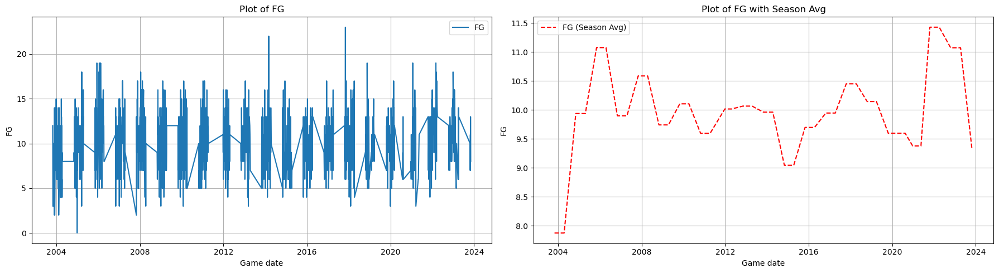

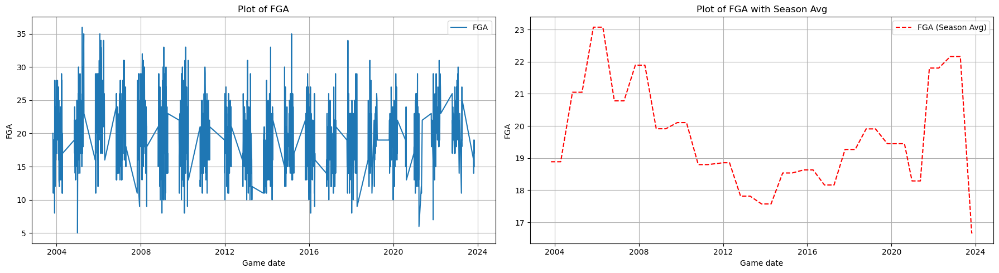

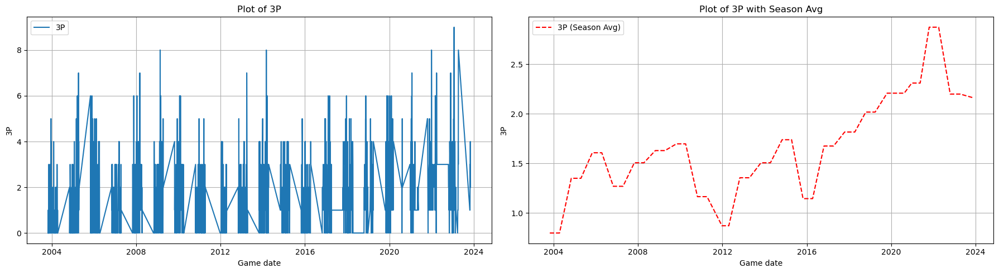

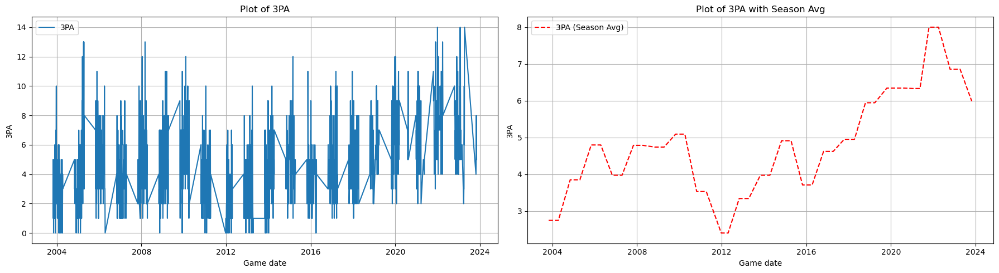

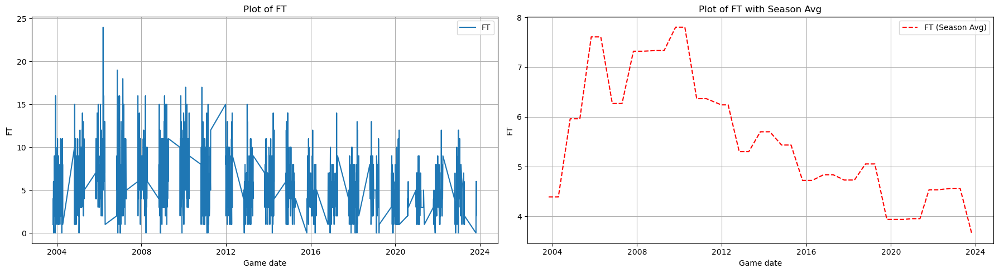

...

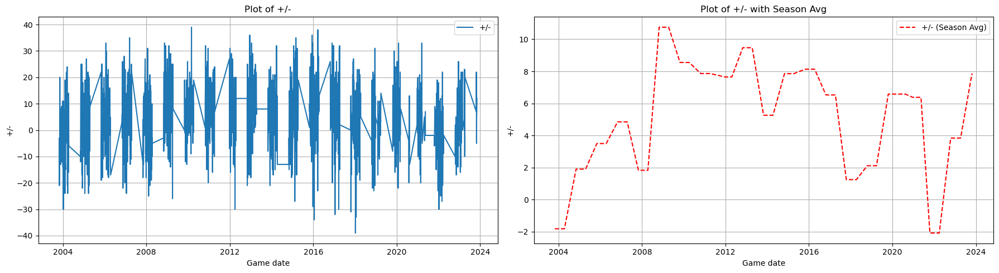

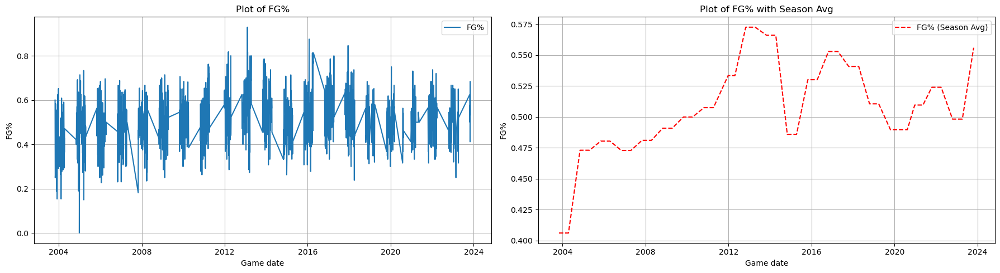

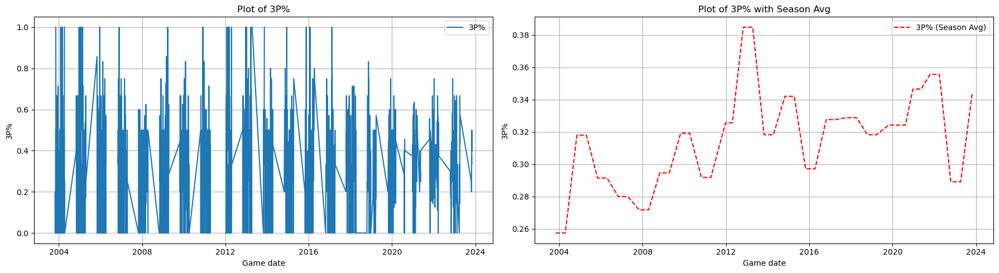

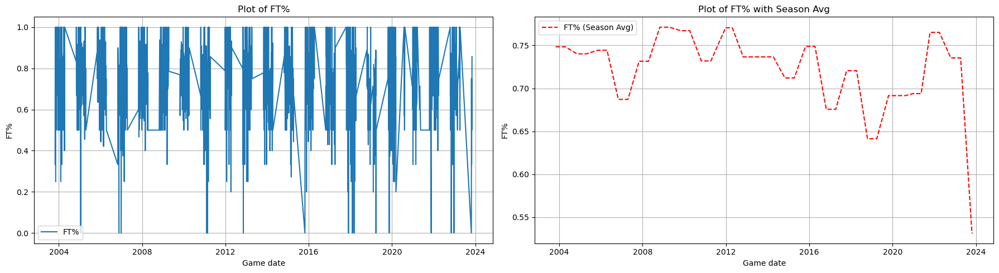

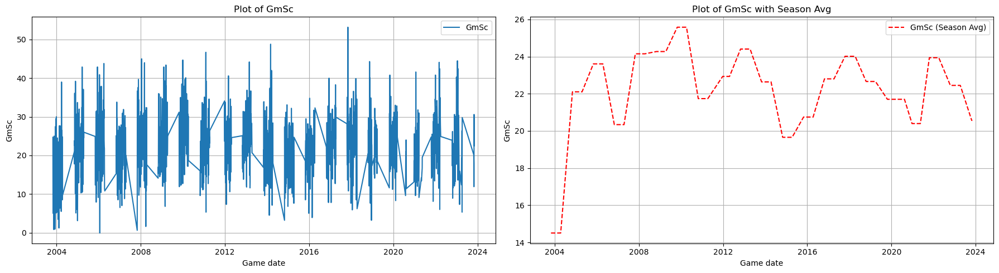

In [25]:
for index, stat in enumerate(numeric_columns[3:]):
    fig, axes = plt.subplots(1, 2, figsize=(18, 5))
    
    axes[0].plot(df['Date'], df[stat], label=stat, linestyle='-')
    axes[0].set_title(f'Plot of {stat}')
    axes[0].set_xlabel('Game date')
    axes[0].set_ylabel(f'{stat}')
    axes[0].legend()
    axes[0].grid(True)
    
    season_avg = df.groupby('Season')[stat].mean()
    axes[1].plot(df['Date'], df['Season'].map(season_avg), label=f'{stat} (Season Avg)', linestyle='--', color='red')
    axes[1].set_title(f'Plot of {stat} with Season Avg')
    axes[1].set_xlabel('Game date')
    axes[1].set_ylabel(f'{stat}')
    axes[1].legend()
    axes[1].grid(True)
    
    plt.tight_layout() 
    plt.show()

We can also observe the distributions of every statistic column. Most of the features have distributions similar to normal.

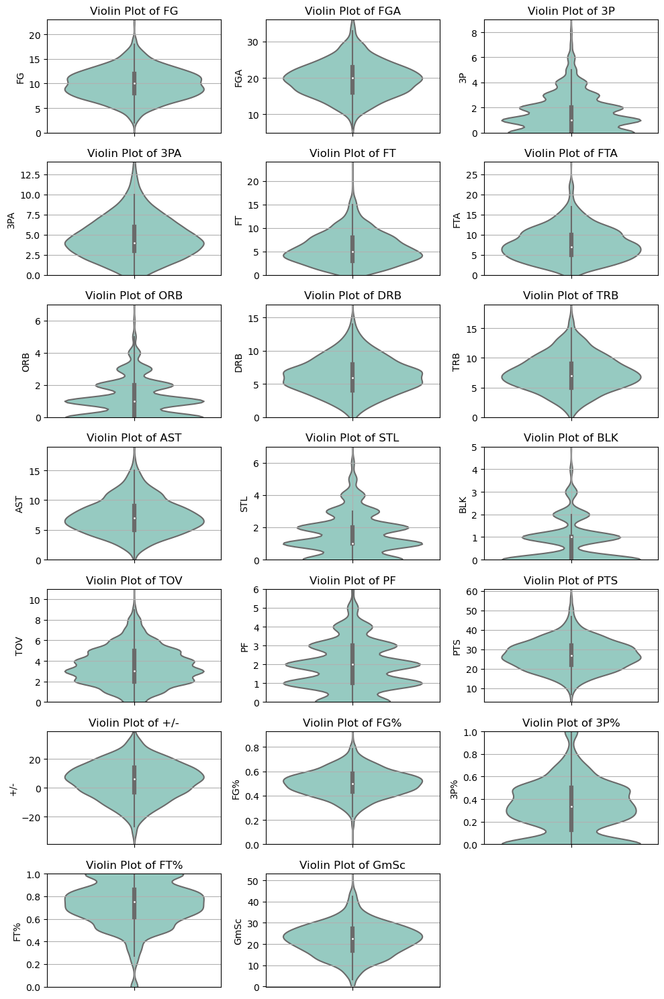

In [26]:
num_cols = 3  
num_rows = int(np.ceil(len(numeric_columns[3:]) / num_cols)) 

fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 15))

for index, stat in enumerate(numeric_columns[3:]):
    row, col = divmod(index, num_cols) 
    ax = axes[row, col] if num_rows > 1 else axes[col]  

    sns.violinplot(data=df, y=stat, palette='Set3', ax=ax)
    ax.set_title(f'Violin Plot of {stat}')
    ax.set_ylabel(f'{stat}')
    ax.grid(True)
    
    y_min = df[stat].min()
    y_max = df[stat].max()
    ax.set_ylim(y_min, y_max)

if len(numeric_columns[3:]) < num_rows * num_cols:
    for i in range(len(numeric_columns[3:]), num_rows * num_cols):
        fig.delaxes(axes[i // num_cols, i % num_cols])

plt.tight_layout()

plt.show()

There aren't too many columns with very big correlation coefficient. We can observe strong connection between points and field goals and free throws, quite big is negative correlation between age or season and minutes played.

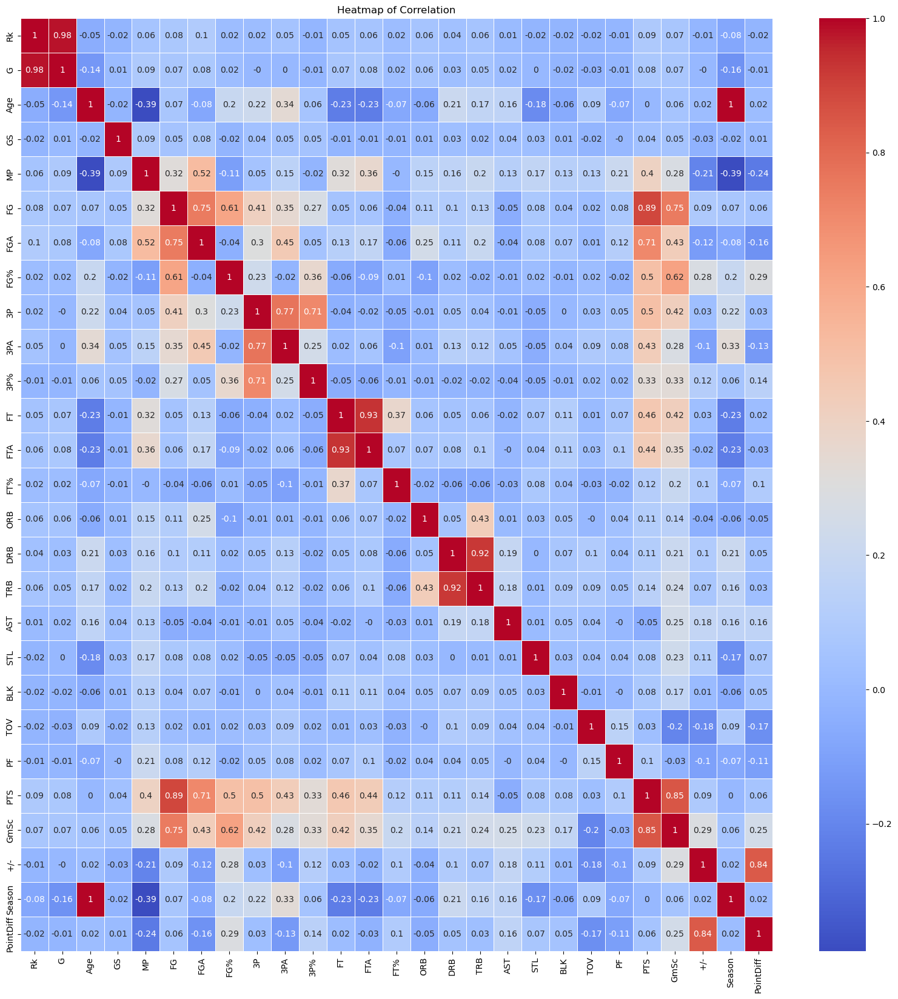

In [27]:
correlation_matrix = df.corr()

correlation_matrix = correlation_matrix.round(2)

plt.figure(figsize=(20,20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Heatmap of Correlation')
plt.show()

Features have very different brackets, therefore violinplot doesn't look very clear. Data need to be standarized to the further processing.

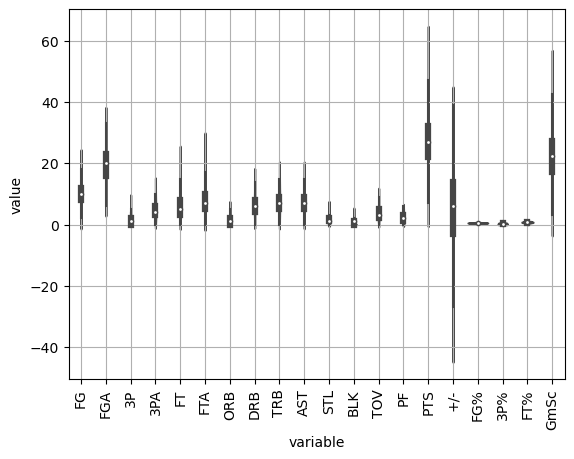

In [28]:
ax = sns.violinplot(x='variable', y='value', data=df[numeric_columns[3:]].melt())
ax.grid()
_ = ax.set_xticklabels(df[numeric_columns[3:]].keys(), rotation=90)

Now we should drop useless columns and save the dataset which could be used in the other projects.

In [29]:
df.drop(columns=['G', 'Rk', 'GS'], inplace=True)

In [30]:
df.to_csv('lebron_stats.csv', index=False)

# Preparation for data processing.

First step - dataset division.

In [31]:
X_train = df[df['Season'] < 2019]
X_test = df[df['Season'] >= 2019]

In [32]:
X_train

,Date,Age,Tm,Opp,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,Season,WinLoss,PointDiff
0,2003-10-29,6873,CLE,SAC,42.833,12,20,0.600,0,2,0.000,1,3,0.333,2,4,6,9,4,0,2,3,25,24.7,-9,2004,L,-14
1,2003-10-30,6874,CLE,PHO,40.350,8,17,0.471,1,5,0.200,4,7,0.571,2,10,12,8,1,0,7,1,21,14.7,-3,2004,L,-9
2,2003-11-01,6876,CLE,POR,39.167,3,12,0.250,0,1,0.000,2,2,1.000,0,4,4,6,2,0,2,3,8,5.0,-21,2004,L,-19
3,2003-11-05,6880,CLE,DEN,41.100,3,11,0.273,0,2,0.000,1,1,1.000,2,9,11,7,2,3,2,1,7,11.2,-3,2004,L,-4
4,2003-11-07,6882,CLE,IND,43.733,8,18,0.444,1,2,0.500,6,7,0.857,0,5,5,3,0,0,7,2,23,9.0,-7,2004,L,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1138,2018-04-03,12139,CLE,TOR,37.267,8,14,0.571,3,6,0.500,8,11,0.727,0,10,10,6,0,0,5,2,27,20.6,12,2018,W,6
1139,2018-04-05,12141,CLE,WAS,38.800,12,20,0.600,2,7,0.286,7,10,0.700,2,7,9,14,0,0,6,2,33,29.1,13,2018,W,4
1140,2018-04-06,12142,CLE,PHI,40.183,17,29,0.586,4,8,0.500,6,11,0.545,1,10,11,11,2,1,8,0,44,34.6,7,2018,L,-2
1141,2018-04-09,12145,CLE,NYK,38.633,7,16,0.438,3,6,0.500,9,10,0.900,0,6,6,11,1,0,4,2,26,22.9,14,2018,W,14


In [33]:
X_test

,Date,Age,Tm,Opp,MP,FG,FGA,FG%,3P,3PA,3P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,GmSc,+/-,Season,WinLoss,PointDiff
1143,2018-10-18,12337,LAL,POR,37.333,9,16,0.563,0,4,0.000,8,9,0.889,2,10,12,6,1,0,6,3,26,20.4,-4,2019,L,-9
1144,2018-10-20,12339,LAL,HOU,38.867,9,22,0.409,1,7,0.143,5,7,0.714,0,5,5,5,2,1,1,0,24,18.1,-13,2019,L,-9
1145,2018-10-22,12341,LAL,SAS,42.867,11,25,0.440,2,8,0.250,8,11,0.727,2,6,8,14,1,1,5,2,32,26.6,-5,2019,L,-1
1146,2018-10-24,12343,LAL,PHO,28.067,7,16,0.438,1,5,0.200,4,4,1.000,0,7,7,10,3,0,0,1,19,22.3,19,2019,W,18
1147,2018-10-25,12344,LAL,DEN,34.667,10,17,0.588,1,5,0.200,7,10,0.700,0,11,11,11,3,0,2,3,28,29.7,13,2019,W,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1422,2023-10-26,14170,LAL,PHO,35.000,7,14,0.500,1,5,0.200,6,8,0.750,1,7,8,9,2,2,5,1,21,20.3,22,2024,W,5
1423,2023-10-29,14173,LAL,SAC,39.083,11,19,0.579,3,8,0.375,2,6,0.333,0,15,15,8,0,0,8,2,27,17.8,-5,2024,L,-5
1424,2023-10-30,14174,LAL,ORL,32.783,7,17,0.412,2,6,0.333,3,4,0.750,0,3,3,4,3,1,5,0,19,11.9,5,2024,W,3
1425,2023-11-01,14176,LAL,LAC,42.483,13,19,0.684,4,8,0.500,5,10,0.500,0,12,12,7,1,2,4,3,35,30.6,6,2024,W,5


Now we're dropping columns that won't be predicted. We should take into consideration only the features that are predicted by Basketball Reference.

In [34]:
selected_stats = df.drop(columns=['Date', 'Tm', 'Opp', 'Age', '+/-', 'Season', 
                                  'WinLoss', 'PointDiff', 'FT%', 'FG%', '3P%', 'GmSc',
                                  'DRB'])

In [35]:
selected_stats = selected_stats.columns
selected_stats

Index(['MP', 'FG', 'FGA', '3P', '3PA', 'FT', 'FTA', 'ORB', 'TRB', 'AST', 'STL',
       'BLK', 'TOV', 'PF', 'PTS'],
      dtype='object')

Now we have to standarize the data by subtraction of mean and division by the standard deviation (to receive the mean = 0 and st.dev = 1).

In [36]:
column_indices = {name: i for i, name in enumerate(df.columns)}

train_mean = X_train[selected_stats].mean()
train_std = X_train[selected_stats].std()

X_train = (X_train[selected_stats] - train_mean)/train_std
X_test = (X_test[selected_stats] - train_mean)/train_std

In [37]:
X_train

,MP,FG,FGA,3P,3PA,FT,FTA,ORB,TRB,AST,STL,BLK,TOV,PF,PTS
0,0.798059,0.685508,0.085627,-1.011470,-0.901254,-1.454075,-1.215899,0.666197,-0.453802,0.629594,1.805056,-0.842058,-0.800227,0.899554,-0.272386
1,0.311945,-0.601086,-0.529921,-0.296055,0.378415,-0.582240,-0.266276,0.666197,1.545027,0.283453,-0.481437,-0.842058,1.921973,-0.663045,-0.778008
2,0.080341,-2.209329,-1.555834,-1.011470,-1.327810,-1.163463,-1.453304,-1.025944,-1.120079,-0.408827,0.280727,-0.842058,-0.800227,0.899554,-2.421281
3,0.458778,-2.209329,-1.761017,-1.011470,-0.901254,-1.454075,-1.690710,0.666197,1.211888,-0.062687,0.280727,2.409538,-0.800227,-0.663045,-2.547687
4,0.974258,-0.601086,-0.324738,-0.296055,-0.901254,-0.001017,-0.266276,-1.025944,-0.786941,-1.447248,-1.243602,-0.842058,1.921973,0.118254,-0.525197
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1138,-0.291634,-0.601086,-1.145469,1.134774,0.804971,0.580206,0.683346,-1.025944,0.878750,-0.408827,-1.243602,-0.842058,0.833093,0.118254,-0.019575
1139,0.008491,0.685508,0.085627,0.419359,1.231527,0.289594,0.445940,0.666197,0.545612,2.360295,-1.243602,-0.842058,1.377533,0.118254,0.738859
1140,0.279251,2.293751,1.932271,1.850189,1.658084,-0.001017,0.683346,-0.179873,1.211888,1.321874,0.280727,0.241807,2.466413,-1.444345,2.129321
1141,-0.024203,-0.922735,-0.735103,1.134774,0.804971,0.870818,0.445940,-1.025944,-0.453802,1.321874,-0.481437,-0.842058,0.288653,0.118254,-0.145980


In [38]:
X_test

,MP,FG,FGA,3P,3PA,FT,FTA,ORB,TRB,AST,STL,BLK,TOV,PF,PTS
1143,-0.278713,-0.279437,-0.735103,-1.011470,-0.048142,0.580206,0.208535,0.666197,1.545027,-0.408827,-0.481437,-0.842058,1.377533,0.899554,-0.145980
1144,0.021608,-0.279437,0.495993,-0.296055,1.231527,-0.291629,-0.266276,-1.025944,-0.786941,-0.754967,0.280727,0.241807,-1.344667,-1.444345,-0.398791
1145,0.804716,0.363860,1.111541,0.419359,1.658084,0.580206,0.683346,0.666197,0.212474,2.360295,-0.481437,0.241807,0.833093,0.118254,0.612453
1146,-2.092781,-0.922735,-0.735103,-0.296055,0.378415,-0.582240,-0.978493,-1.025944,-0.120664,0.975734,1.042892,-0.842058,-1.889107,-0.663045,-1.030819
1147,-0.800654,0.042211,-0.529921,-0.296055,0.378415,0.289594,0.445940,-1.025944,1.211888,1.321874,1.042892,-0.842058,-0.800227,0.899554,0.106831
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1422,-0.735460,-0.922735,-1.145469,-0.296055,0.378415,-0.001017,-0.028871,-0.179873,0.212474,0.629594,0.280727,1.325672,0.833093,-0.663045,-0.778008
1423,0.063896,0.363860,-0.119555,1.134774,1.658084,-1.163463,-0.503682,-1.025944,2.544441,0.283453,-1.243602,-0.842058,2.466413,0.118254,-0.019575
1424,-1.169498,-0.922735,-0.529921,0.419359,0.804971,-0.872852,-0.978493,-1.025944,-1.453217,-1.101108,1.042892,0.241807,0.833093,-1.444345,-1.030819
1425,0.729537,1.007157,-0.119555,1.850189,1.658084,-0.291629,0.445940,-1.025944,1.545027,-0.062687,-0.481437,1.325672,0.288653,0.899554,0.991670


Attention: we could use the StandardScaler() method, but it could cause the difficulties with visualization and transformation of the data.

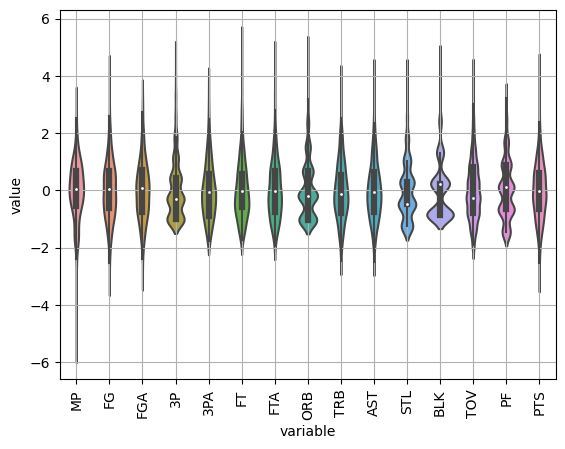

In [39]:
ax = sns.violinplot(x='variable', y='value', data=X_train.melt())
ax.grid()
_ = ax.set_xticklabels(X_train.keys(), rotation=90)

A WindowGenerator class is scooped up from the Tensorflow tutorial. As we can read, this class can:
- Handle the indexes and offsets as shown in the diagrams above.
- Split windows of features into (features, labels) pairs.
- Plot the content of the resulting windows.
- Efficiently generate batches of these windows from the training, evaluation, and test data.

In [40]:
class WindowGenerator():
  def __init__(self, input_width, label_width, shift,
               train_df=X_train, test_df=X_test,
               label_columns=None):
    self.train_df = train_df
    self.test_df = test_df

    self.label_columns = label_columns
    if label_columns is not None:
      self.label_columns_indices = {name: i for i, name in
                                    enumerate(label_columns)}
    self.column_indices = {name: i for i, name in
                           enumerate(train_df.columns)}

    self.input_width = input_width
    self.label_width = label_width
    self.shift = shift

    self.total_window_size = input_width + shift

    self.input_slice = slice(0, input_width)
    self.input_indices = np.arange(self.total_window_size)[self.input_slice]

    self.label_start = self.total_window_size - self.label_width
    self.labels_slice = slice(self.label_start, None)
    self.label_indices = np.arange(self.total_window_size)[self.labels_slice]

  def __repr__(self):
    return '\n'.join([
        f'Total window size: {self.total_window_size}',
        f'Input indices: {self.input_indices}',
        f'Label indices: {self.label_indices}',
        f'Label column name(s): {self.label_columns}'])

def split_window(self, features):
  inputs = features[:, self.input_slice, :]
  labels = features[:, self.labels_slice, :]
  if self.label_columns is not None:
    labels = tf.stack(
        [labels[:, :, self.column_indices[name]] for name in self.label_columns],
        axis=-1)

  inputs.set_shape([None, self.input_width, None])
  labels.set_shape([None, self.label_width, None])

  return inputs, labels

WindowGenerator.split_window = split_window

def plot(self, model=None, plot_col='PTS', max_subplots=1):
  inputs, labels = self.example
  plt.figure(figsize=(10, 2))
  plot_col_index = self.column_indices[plot_col]
  max_n = min(max_subplots, len(inputs))
  for n in range(max_n):
    plt.subplot(max_n, 1, n+1)
    plt.ylabel(f'{plot_col} [normed]')
    plt.plot(self.input_indices, inputs[n, :, plot_col_index],
             label='Inputs', marker='.', zorder=-10)

    if self.label_columns:
      label_col_index = self.label_columns_indices.get(plot_col, None)
    else:
      label_col_index = plot_col_index

    if label_col_index is None:
      continue

    plt.scatter(self.label_indices, labels[n, :, label_col_index],
                edgecolors='k', label='Labels', c='#2ca02c', s=64)
    if model is not None:
      predictions = model(inputs)
      plt.scatter(self.label_indices, predictions[n, :, label_col_index],
                  marker='X', edgecolors='k', label='Predictions',
                  c='#ff7f0e', s=64)

    if n == 0:
      plt.legend()

  plt.xlabel('Game')

WindowGenerator.plot = plot

def make_dataset(self, data):
  data = np.array(data, dtype=np.float32)
  ds = tf.keras.utils.timeseries_dataset_from_array(
      data=data,
      targets=None,
      sequence_length=self.total_window_size,
      sequence_stride=1,
      shuffle=True,
      batch_size=32,)

  ds = ds.map(self.split_window)

  return ds

WindowGenerator.make_dataset = make_dataset

@property
def train(self):
  return self.make_dataset(self.train_df)

@property
def test(self):
  return self.make_dataset(self.test_df)

@property
def example(self):
  """Get and cache an example batch of `inputs, labels` for plotting."""
  result = getattr(self, '_example', None)
  if result is None:
    result = next(iter(self.train))
    self._example = result
  return result

WindowGenerator.train = train
WindowGenerator.test = test
WindowGenerator.example = example

Columns from dataset X_train should be saved as a list to make further plotting easier.

In [41]:
cols = X_train.columns.to_list()
cols

['MP',
 'FG',
 'FGA',
 '3P',
 '3PA',
 'FT',
 'FTA',
 'ORB',
 'TRB',
 'AST',
 'STL',
 'BLK',
 'TOV',
 'PF',
 'PTS']

Now we should create the generator instance. We should be careful and don't forget that input_width and shift sum shouldn't exceed the test set size.

In [42]:
window_2024 = WindowGenerator(
    input_width=142, label_width=142, shift=142)

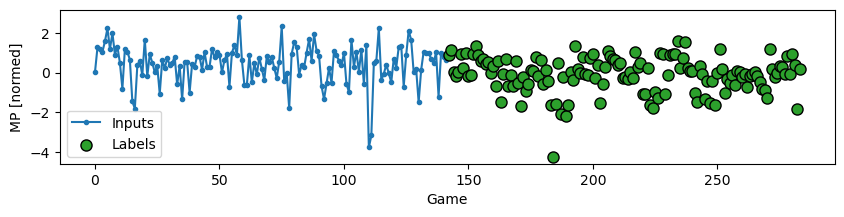

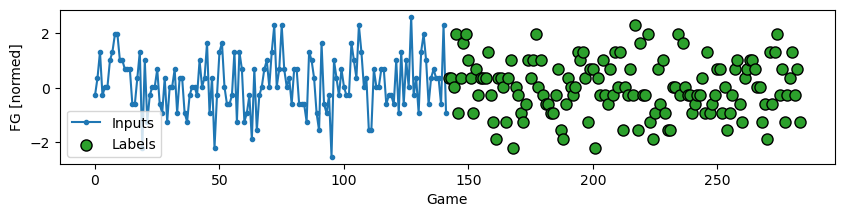

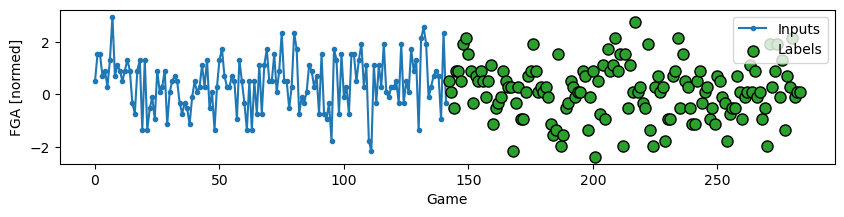

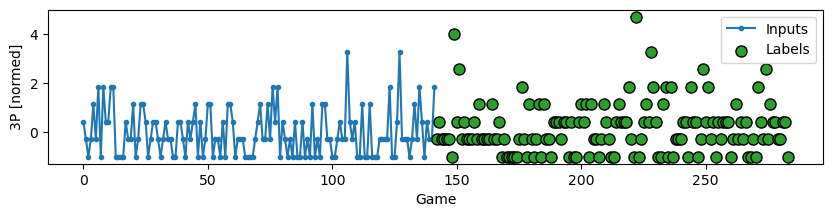

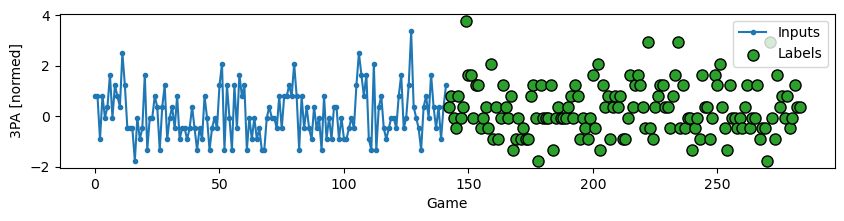

...

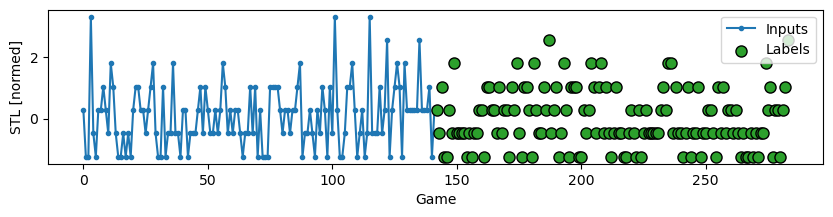

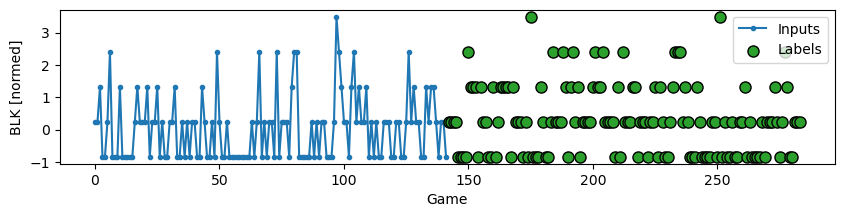

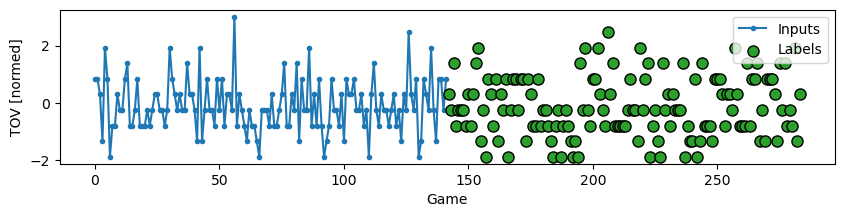

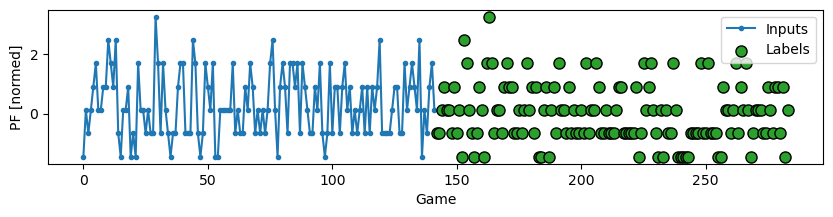

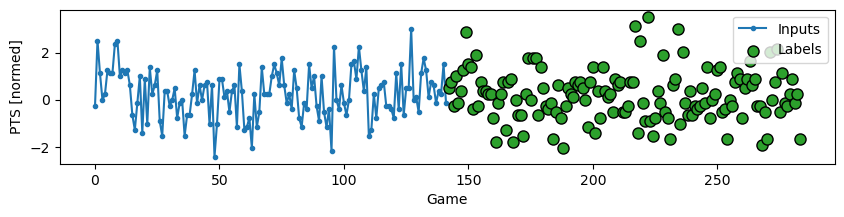

In [43]:
for col in cols:
    window_2024.plot(plot_col=col)

In [44]:
for example_inputs, example_labels in window_2024.train.take(1):
    print(f'Inputs shape (batch, time, features): {example_inputs.shape}')
    print(f'Labels shape (batch, time, features): {example_labels.shape}')

Inputs shape (batch, time, features): (32, 142, 15)
Labels shape (batch, time, features): (32, 142, 15)


# Modelling.

Let's start with defining the function containing the compilation and fitting of model in one.

In [45]:
MAX_EPOCHS = 50

def compile_and_fit(model, window, patience=5):
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=patience,
                                                    mode='min',
                                                    restore_best_weights=True)
    
    model.compile(loss=tf.losses.MeanSquaredError(),
                  optimizer=tf.optimizers.Adam(),
                  metrics=[tf.metrics.MeanSquaredError()])

    history = model.fit(window.train, epochs=MAX_EPOCHS,
                        validation_data=window.test,
                        callbacks=[early_stopping])
    return history

To compare the performance of models we should create the dict containing the metrics.

In [46]:
performance = {}

## LSTM.

In [47]:
lstm_model = tf.keras.models.Sequential([
    tf.keras.layers.LSTM(30, return_sequences=True),
    tf.keras.layers.LSTM(15, return_sequences=True),
    tf.keras.layers.Dense(units=15)
])

history = compile_and_fit(lstm_model, window_2024)
performance['LSTM'] = lstm_model.evaluate(window_2024.test, verbose=0)

Epoch 1/50
27/27 [==============================] - 8s 108ms/step - loss: 0.9527 - mean_squared_error: 0.9527 - val_loss: 1.1193 - val_mean_squared_error: 1.1193
Epoch 2/50
27/27 [==============================] - 2s 77ms/step - loss: 0.9259 - mean_squared_error: 0.9259 - val_loss: 1.1037 - val_mean_squared_error: 1.1037
Epoch 3/50
27/27 [==============================] - 2s 75ms/step - loss: 0.9069 - mean_squared_error: 0.9069 - val_loss: 1.0859 - val_mean_squared_error: 1.0859
Epoch 4/50
27/27 [==============================] - 2s 76ms/step - loss: 0.8891 - mean_squared_error: 0.8891 - val_loss: 1.1046 - val_mean_squared_error: 1.1046
Epoch 5/50
27/27 [==============================] - 2s 81ms/step - loss: 0.8701 - mean_squared_error: 0.8701 - val_loss: 1.1366 - val_mean_squared_error: 1.1366
Epoch 6/50
27/27 [==============================] - 2s 87ms/step - loss: 0.8494 - mean_squared_error: 0.8494 - val_loss: 1.1596 - val_mean_squared_error: 1.1596
Epoch 7/50
27/27 [===============

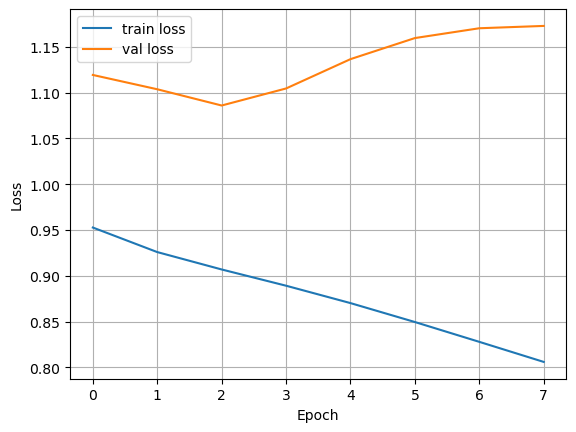

In [48]:
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid()

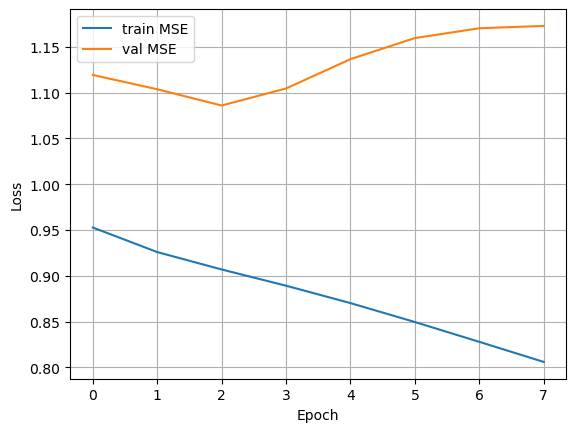

In [49]:
plt.plot(history.history['mean_squared_error'], label='train MSE')
plt.plot(history.history['val_mean_squared_error'], label='val MSE')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid()

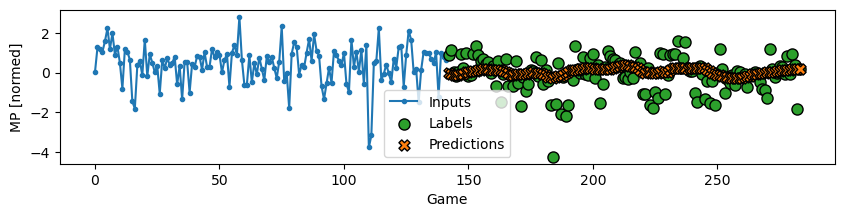

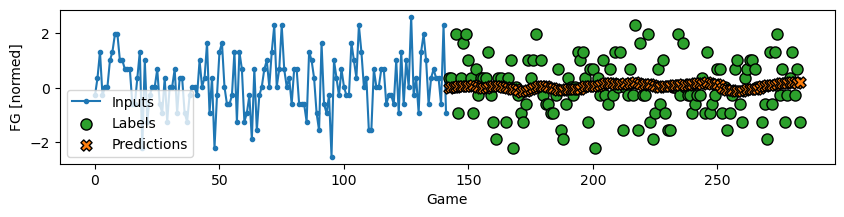

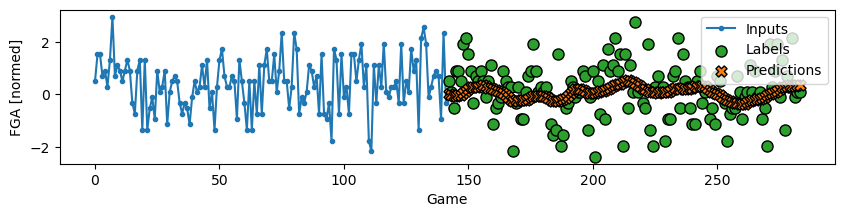

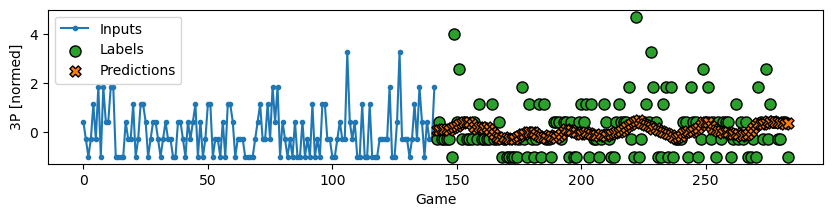

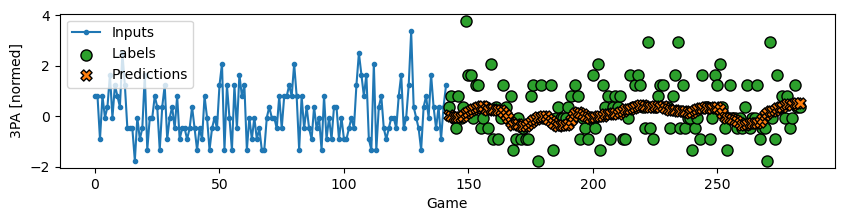

...

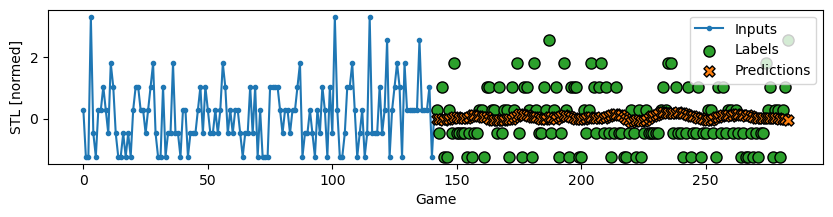

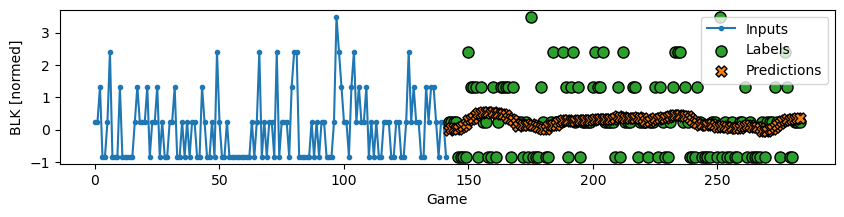

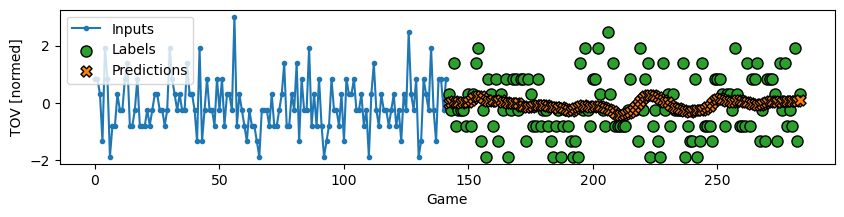

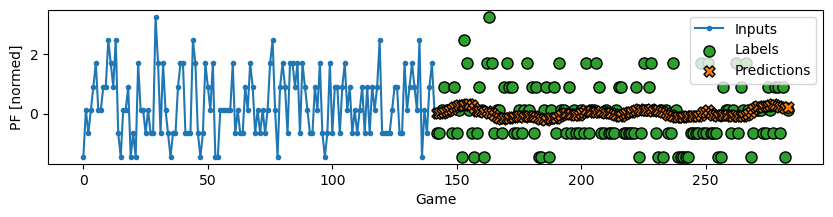

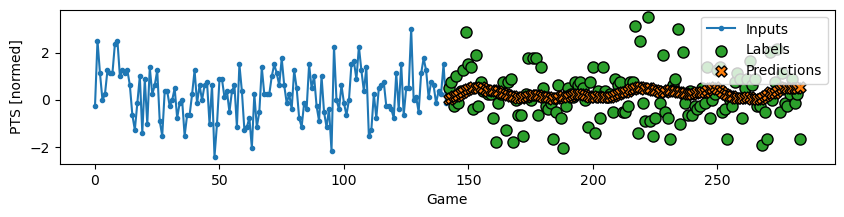

In [50]:
for col in cols:
    window_2024.plot(lstm_model, plot_col=col)

## Simple RNN.

In [51]:
rnn_model = tf.keras.models.Sequential([
    tf.keras.layers.SimpleRNN(30, return_sequences=True),
    tf.keras.layers.SimpleRNN(15, return_sequences=True),
    tf.keras.layers.Dense(units=15)
])

rnn_history = compile_and_fit(rnn_model, window_2024)
performance['RNN'] = rnn_model.evaluate(window_2024.test, verbose=0)

Epoch 1/50
27/27 [==============================] - 4s 58ms/step - loss: 1.1447 - mean_squared_error: 1.1447 - val_loss: 1.3518 - val_mean_squared_error: 1.3518
Epoch 2/50
27/27 [==============================] - 1s 47ms/step - loss: 1.0197 - mean_squared_error: 1.0197 - val_loss: 1.2690 - val_mean_squared_error: 1.2690
Epoch 3/50
27/27 [==============================] - 1s 45ms/step - loss: 0.9663 - mean_squared_error: 0.9663 - val_loss: 1.2290 - val_mean_squared_error: 1.2290
Epoch 4/50
27/27 [==============================] - 1s 44ms/step - loss: 0.9396 - mean_squared_error: 0.9396 - val_loss: 1.2297 - val_mean_squared_error: 1.2297
Epoch 5/50
27/27 [==============================] - 1s 44ms/step - loss: 0.9189 - mean_squared_error: 0.9189 - val_loss: 1.2367 - val_mean_squared_error: 1.2367
Epoch 6/50
27/27 [==============================] - 1s 44ms/step - loss: 0.8991 - mean_squared_error: 0.8991 - val_loss: 1.2481 - val_mean_squared_error: 1.2481
Epoch 7/50
27/27 [================

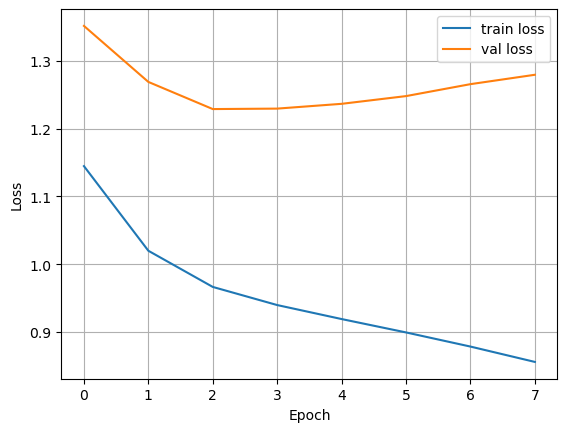

In [52]:
plt.plot(rnn_history.history['loss'], label='train loss')
plt.plot(rnn_history.history['val_loss'], label='val loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid()

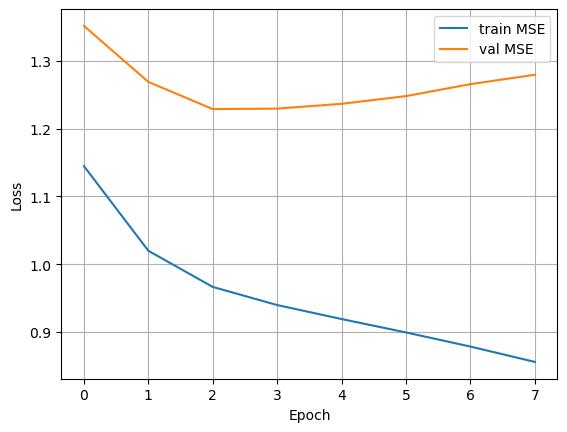

In [53]:
plt.plot(rnn_history.history['mean_squared_error'], label='train MSE')
plt.plot(rnn_history.history['val_mean_squared_error'], label='val MSE')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid()

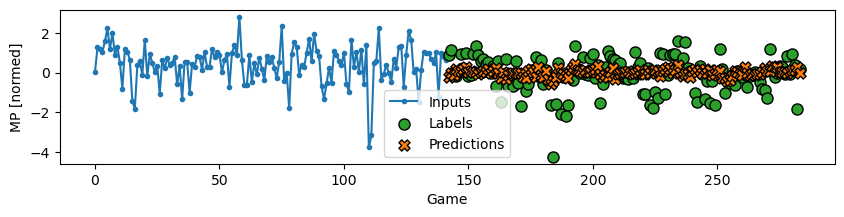

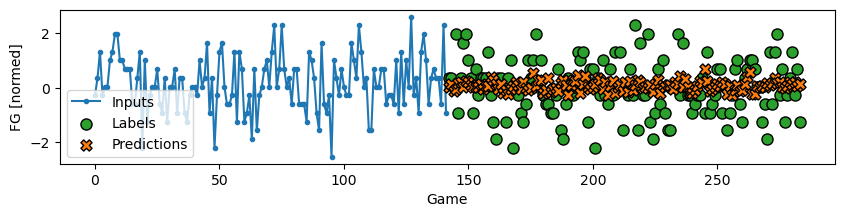

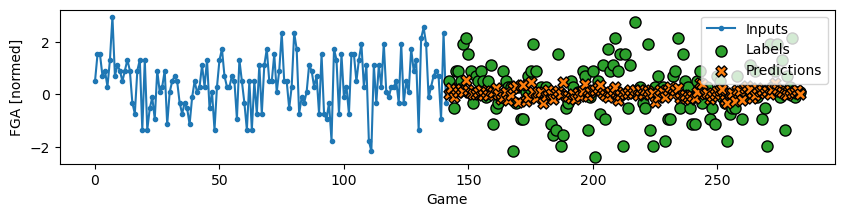

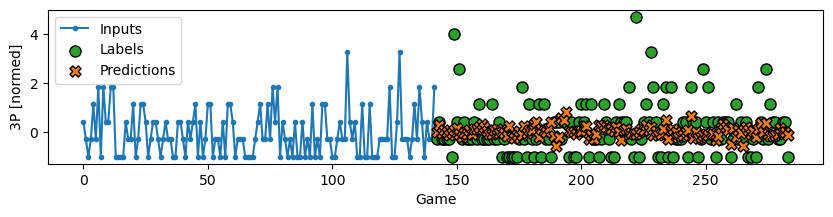

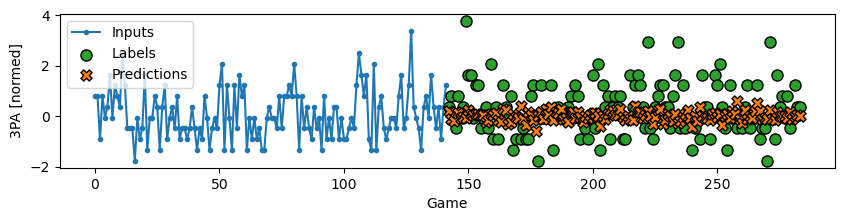

...

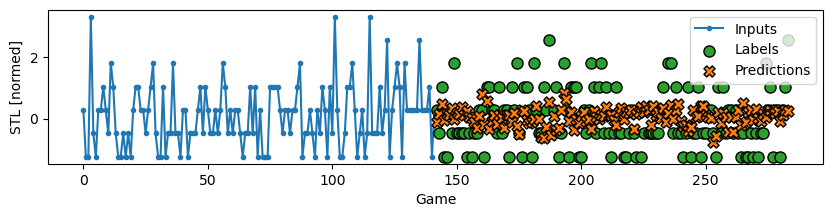

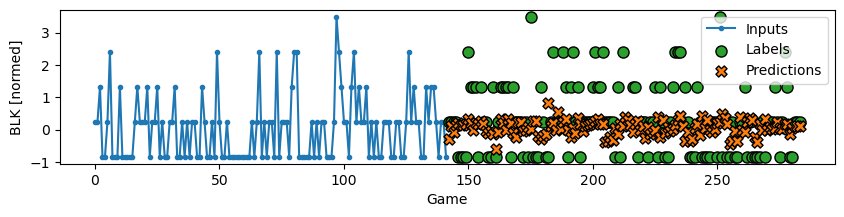

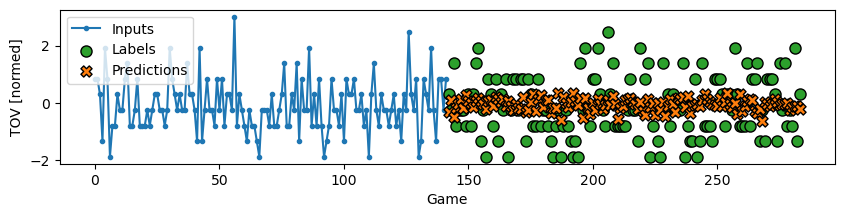

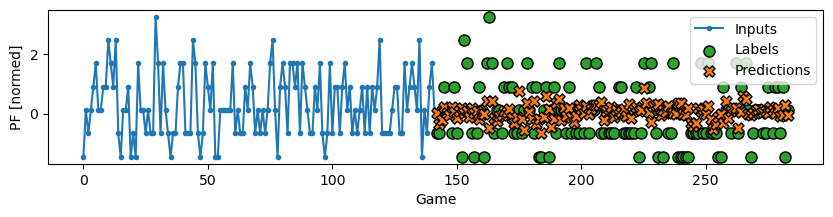

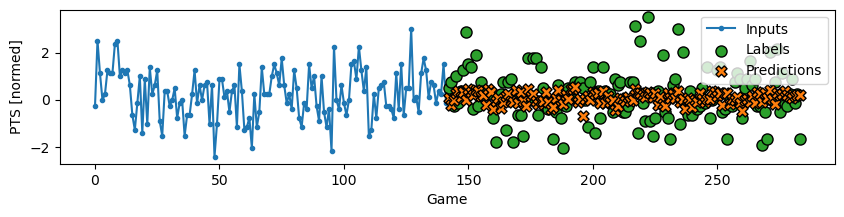

In [54]:
for col in cols:
    window_2024.plot(rnn_model, plot_col=col)

## Dense.

In [55]:
dense_model = tf.keras.Sequential([
    tf.keras.layers.Dense(units=64, activation='relu'),
    tf.keras.layers.Dense(units=64, activation='relu'),
    tf.keras.layers.Dense(units=15)
])

dense_history = compile_and_fit(dense_model, window_2024)
performance['Dense'] = dense_model.evaluate(window_2024.test, verbose=0)

Epoch 1/50
27/27 [==============================] - 1s 15ms/step - loss: 1.0008 - mean_squared_error: 1.0008 - val_loss: 1.2153 - val_mean_squared_error: 1.2153
Epoch 2/50
27/27 [==============================] - 0s 9ms/step - loss: 0.9446 - mean_squared_error: 0.9446 - val_loss: 1.2111 - val_mean_squared_error: 1.2111
Epoch 3/50
27/27 [==============================] - 0s 9ms/step - loss: 0.9211 - mean_squared_error: 0.9211 - val_loss: 1.2259 - val_mean_squared_error: 1.2259
Epoch 4/50
27/27 [==============================] - 0s 9ms/step - loss: 0.9004 - mean_squared_error: 0.9004 - val_loss: 1.2409 - val_mean_squared_error: 1.2409
Epoch 5/50
27/27 [==============================] - 0s 9ms/step - loss: 0.8796 - mean_squared_error: 0.8796 - val_loss: 1.2575 - val_mean_squared_error: 1.2575
Epoch 6/50
27/27 [==============================] - 0s 9ms/step - loss: 0.8574 - mean_squared_error: 0.8574 - val_loss: 1.2774 - val_mean_squared_error: 1.2774
Epoch 7/50
27/27 [=====================

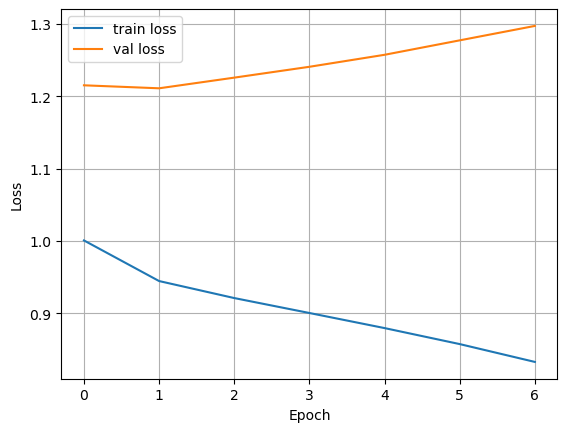

In [56]:
plt.plot(dense_history.history['loss'], label='train loss')
plt.plot(dense_history.history['val_loss'], label='val loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid()

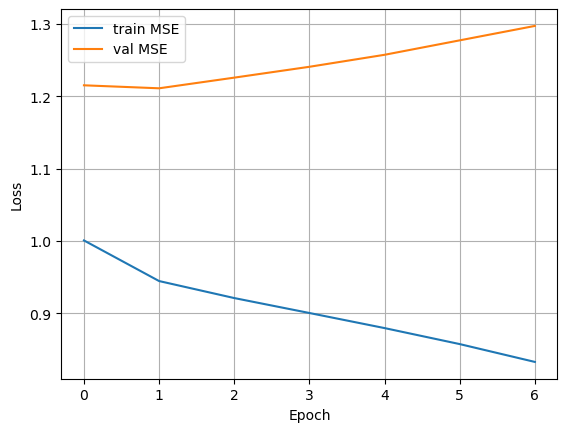

In [57]:
plt.plot(dense_history.history['mean_squared_error'], label='train MSE')
plt.plot(dense_history.history['val_mean_squared_error'], label='val MSE')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid()

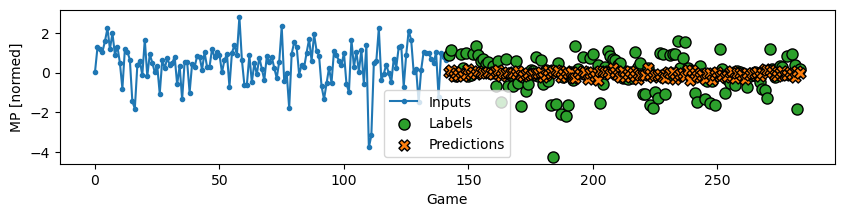

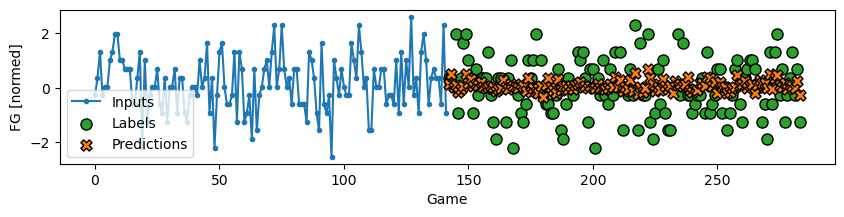

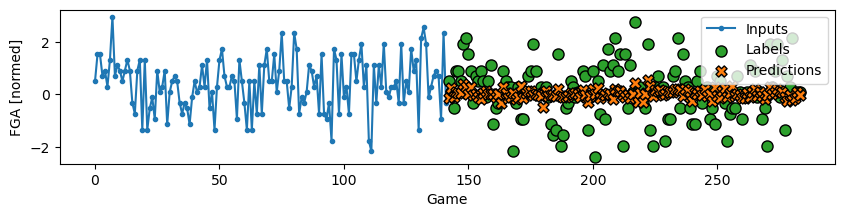

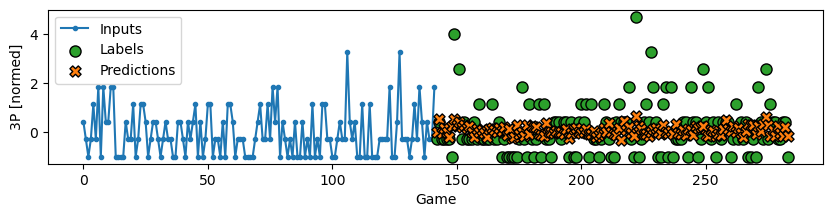

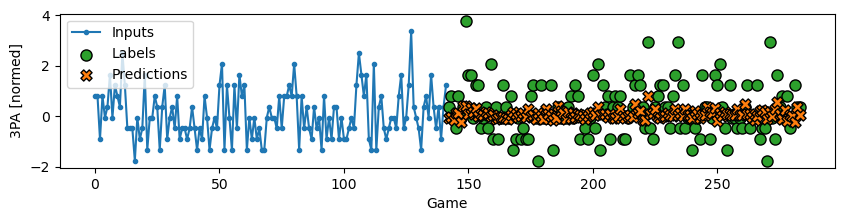

...

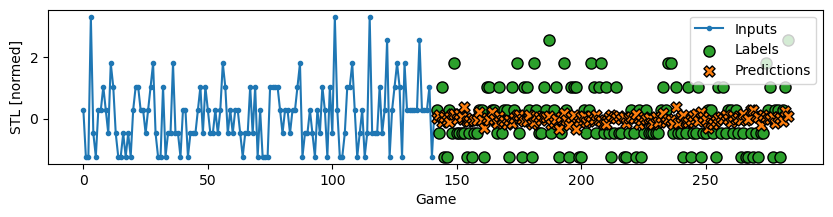

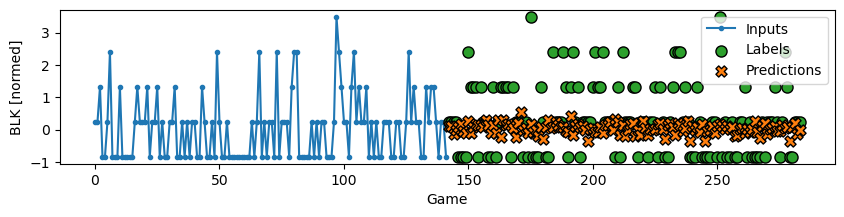

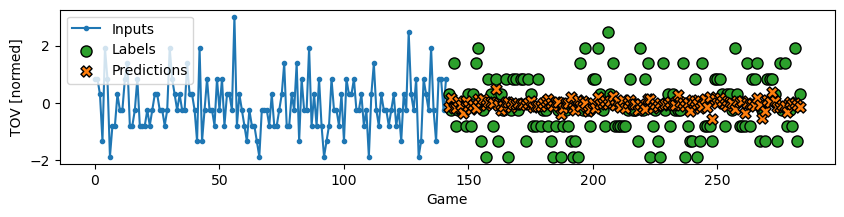

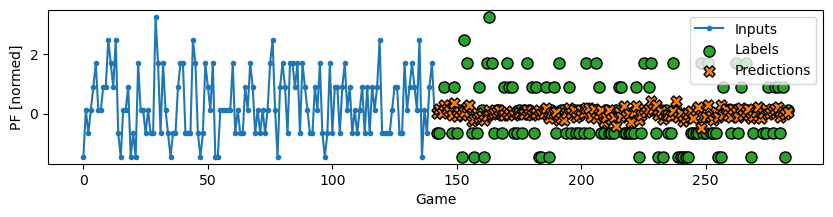

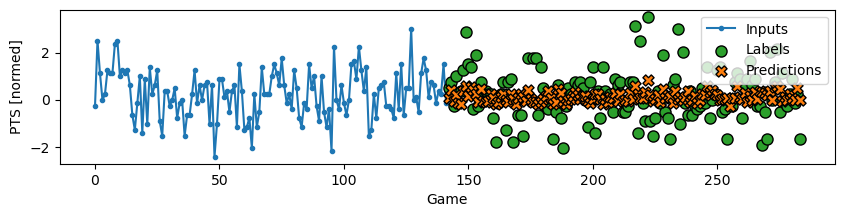

In [58]:
for col in cols:
    window_2024.plot(dense_model, plot_col=col)

## CNN.

In [59]:
conv_model = tf.keras.Sequential([
    tf.keras.layers.Conv1D(filters=8, kernel_size=(1,),
                           activation='relu'),
    tf.keras.layers.Dense(units=15, activation='relu'),
    tf.keras.layers.Dense(units=15),
])

conv_history = compile_and_fit(conv_model, window_2024)
performance['CNN'] = conv_model.evaluate(window_2024.test, verbose=0)

Epoch 1/50
27/27 [==============================] - 1s 12ms/step - loss: 1.1388 - mean_squared_error: 1.1388 - val_loss: 1.2829 - val_mean_squared_error: 1.2829
Epoch 2/50
27/27 [==============================] - 0s 5ms/step - loss: 1.0373 - mean_squared_error: 1.0373 - val_loss: 1.2314 - val_mean_squared_error: 1.2314
Epoch 3/50
27/27 [==============================] - 0s 5ms/step - loss: 0.9998 - mean_squared_error: 0.9998 - val_loss: 1.2146 - val_mean_squared_error: 1.2146
Epoch 4/50
27/27 [==============================] - 0s 5ms/step - loss: 0.9831 - mean_squared_error: 0.9831 - val_loss: 1.2072 - val_mean_squared_error: 1.2072
Epoch 5/50
27/27 [==============================] - 0s 6ms/step - loss: 0.9736 - mean_squared_error: 0.9736 - val_loss: 1.2049 - val_mean_squared_error: 1.2049
Epoch 6/50
27/27 [==============================] - 0s 6ms/step - loss: 0.9673 - mean_squared_error: 0.9673 - val_loss: 1.2066 - val_mean_squared_error: 1.2066
Epoch 7/50
27/27 [=====================

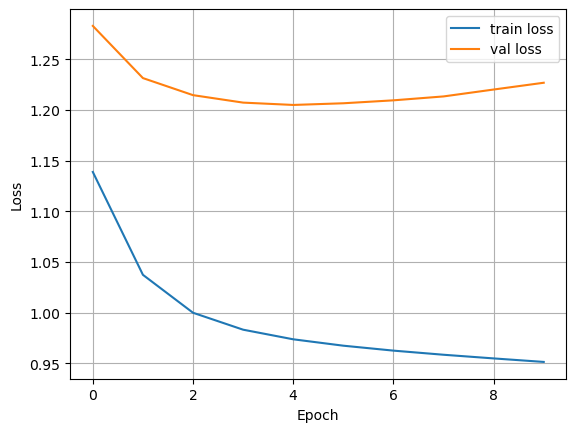

In [60]:
plt.plot(conv_history.history['loss'], label='train loss')
plt.plot(conv_history.history['val_loss'], label='val loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid()

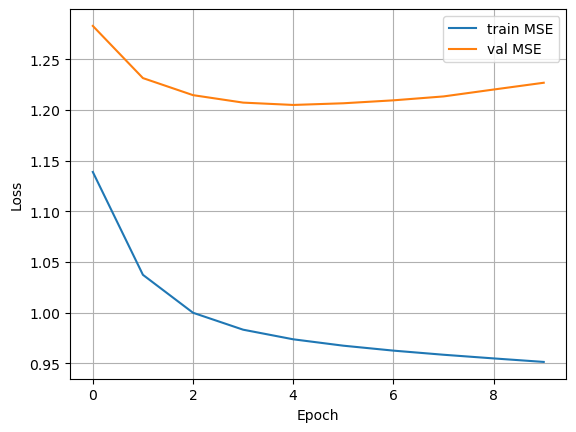

In [61]:
plt.plot(conv_history.history['mean_squared_error'], label='train MSE')
plt.plot(conv_history.history['val_mean_squared_error'], label='val MSE')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid()

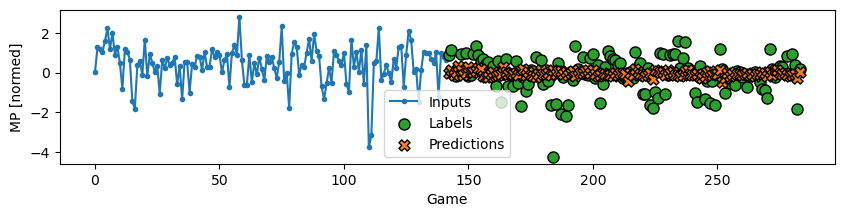

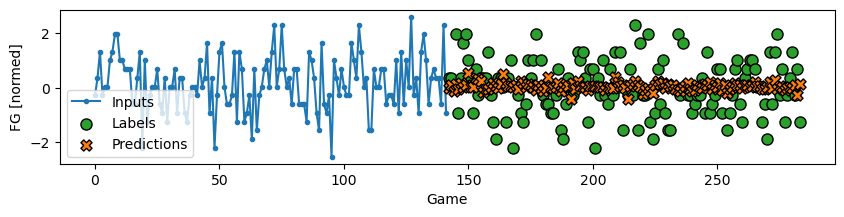

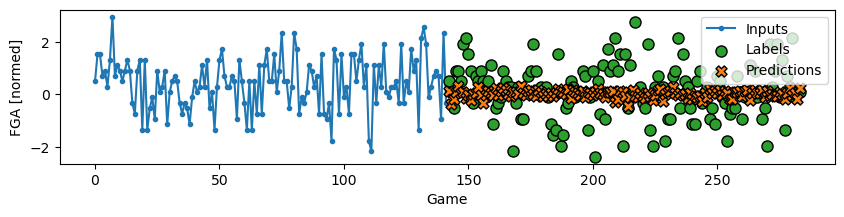

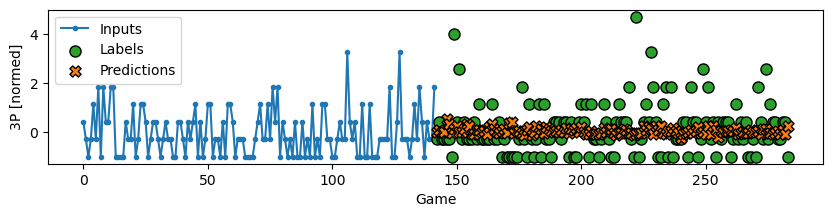

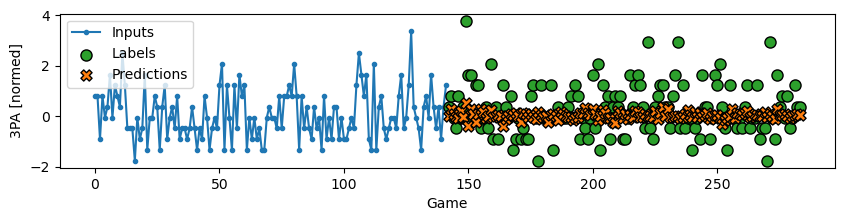

...

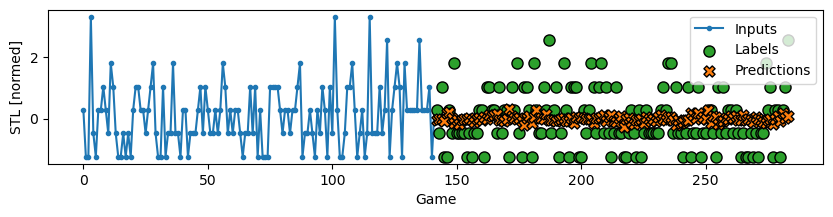

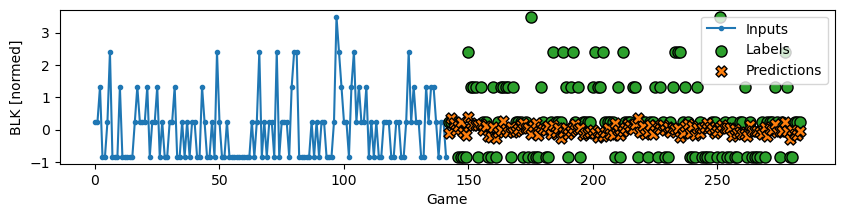

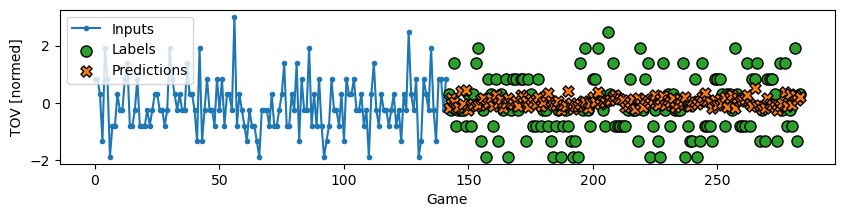

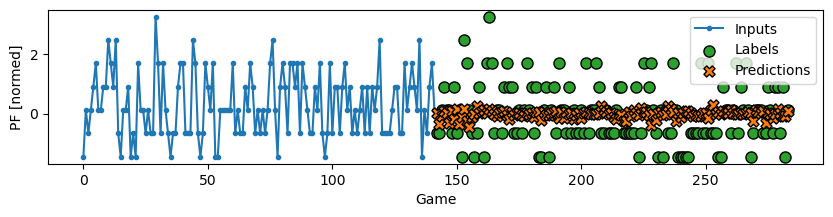

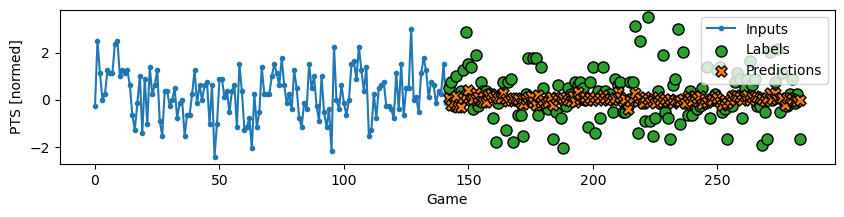

In [62]:
for col in cols:
    window_2024.plot(conv_model, plot_col=col)

## Linear.

In [63]:
linear_model = tf.keras.Sequential([
    tf.keras.layers.Dense(units=15)
])

linear_history = compile_and_fit(linear_model, window_2024)
performance['Linear'] = linear_model.evaluate(window_2024.test, verbose=0)

Epoch 1/50
27/27 [==============================] - 1s 17ms/step - loss: 2.0054 - mean_squared_error: 2.0054 - val_loss: 2.0666 - val_mean_squared_error: 2.0666
Epoch 2/50
27/27 [==============================] - 0s 4ms/step - loss: 1.7840 - mean_squared_error: 1.7840 - val_loss: 1.8925 - val_mean_squared_error: 1.8925
Epoch 3/50
27/27 [==============================] - 0s 4ms/step - loss: 1.6109 - mean_squared_error: 1.6109 - val_loss: 1.7525 - val_mean_squared_error: 1.7525
Epoch 4/50
27/27 [==============================] - 0s 6ms/step - loss: 1.4764 - mean_squared_error: 1.4764 - val_loss: 1.6405 - val_mean_squared_error: 1.6405
Epoch 5/50
27/27 [==============================] - 0s 5ms/step - loss: 1.3716 - mean_squared_error: 1.3715 - val_loss: 1.5487 - val_mean_squared_error: 1.5487
Epoch 6/50
27/27 [==============================] - 0s 5ms/step - loss: 1.2888 - mean_squared_error: 1.2888 - val_loss: 1.4747 - val_mean_squared_error: 1.4747
Epoch 7/50
27/27 [=====================

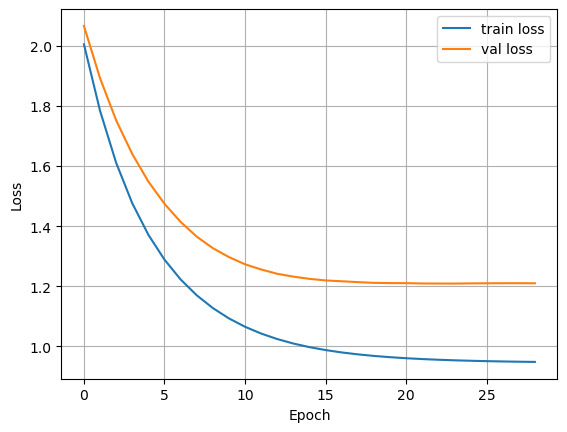

In [64]:
plt.plot(linear_history.history['loss'], label='train loss')
plt.plot(linear_history.history['val_loss'], label='val loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid()

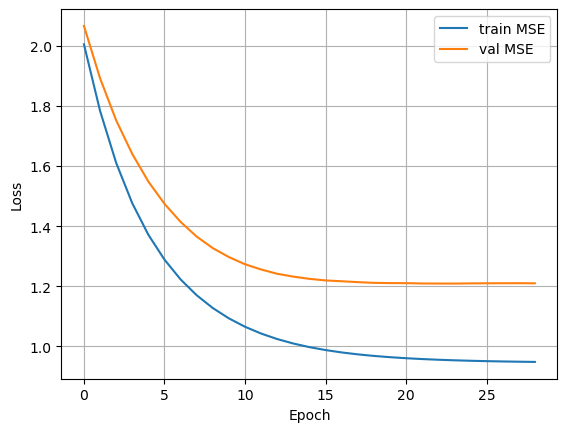

In [65]:
plt.plot(linear_history.history['mean_squared_error'], label='train MSE')
plt.plot(linear_history.history['val_mean_squared_error'], label='val MSE')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid()

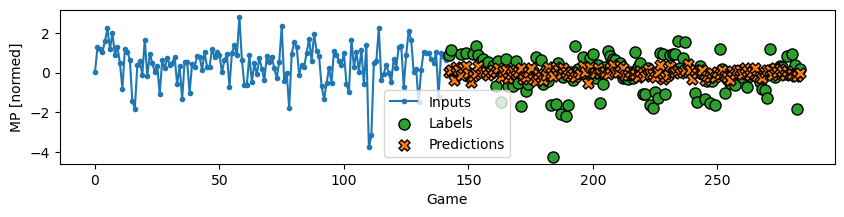

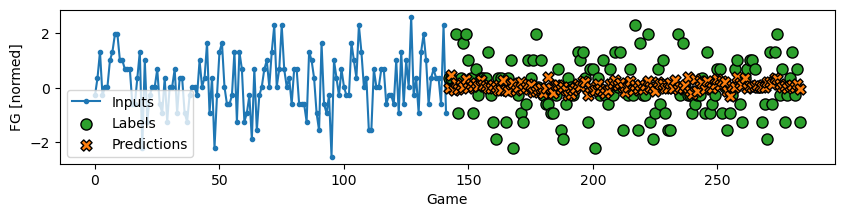

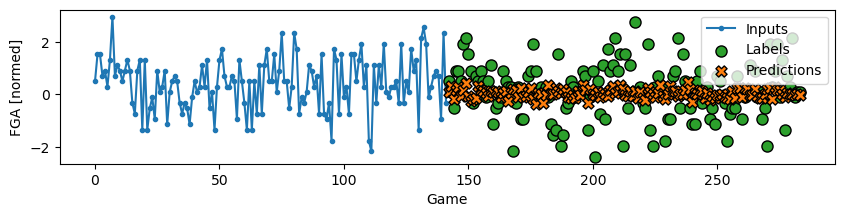

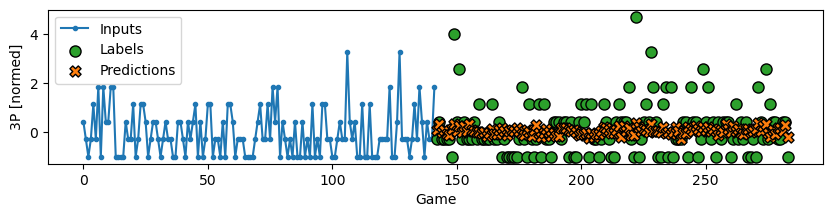

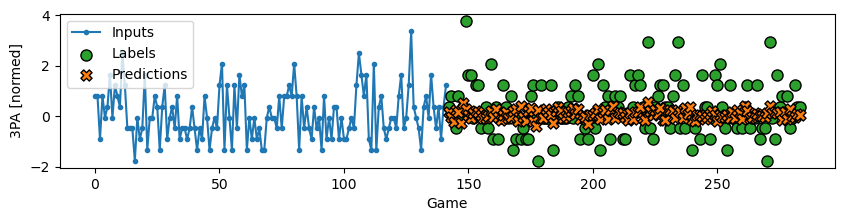

...

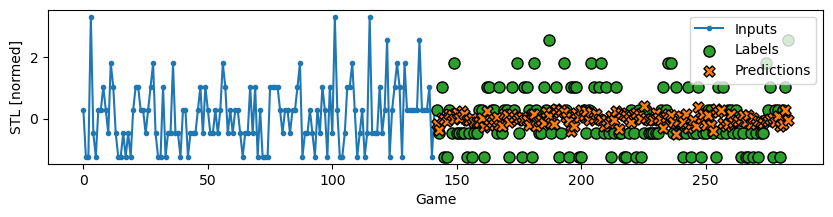

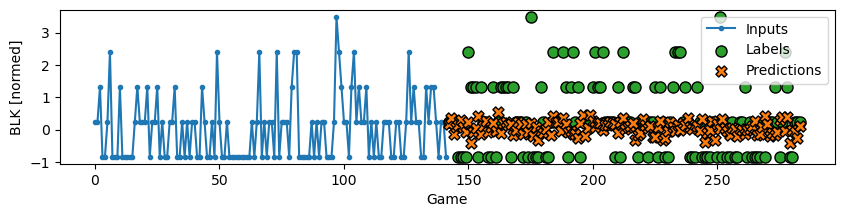

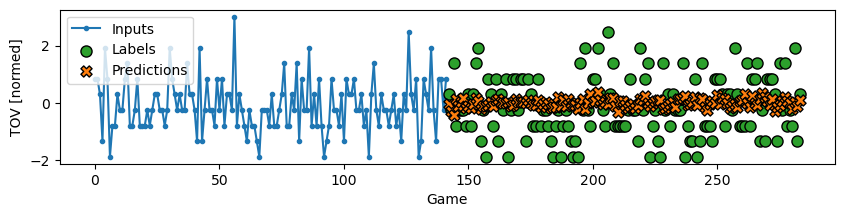

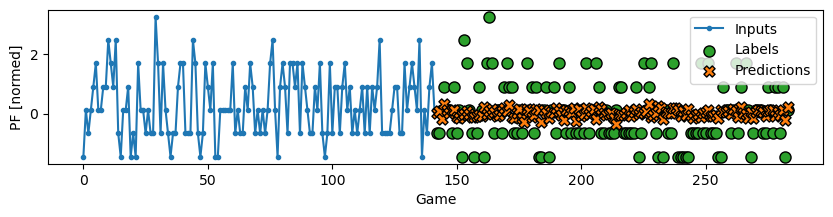

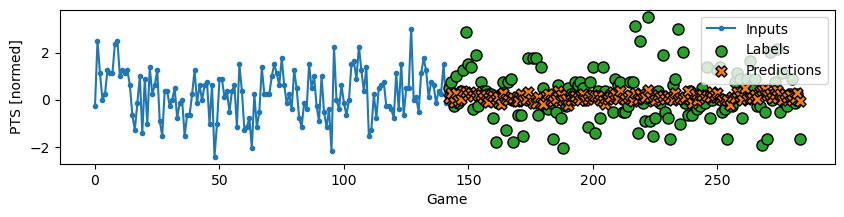

In [66]:
for col in cols:
    window_2024.plot(linear_model, plot_col=col)

The winner of the comparison is the LSTM model. As we can see the metrics aren't very impressive, but some justification could be fact that the data aren't easy to predict.

In [67]:
performance = pd.DataFrame(performance)
performance.iloc[0,]

LSTM      1.085947
RNN       1.228971
Dense     1.211145
CNN       1.204940
Linear    1.209146
Name: 0, dtype: float64

# Predictions.

Predictions have to be made on the test set.

In [68]:
lstm_predictions = lstm_model.predict(window_2024.test)
lstm_predictions.shape

1/1 [==============================] - 1s 701ms/step


(1, 142, 15)

To collect the predictions in the dataframe, we have to reshape the array with predictions. The next operation is 'unstandarization' of data. Because six games of the season have been finished, we should add them to the dataframe of predictions.

In [69]:
lstm_predictions = lstm_predictions.reshape(142,15)
lstm_df = pd.DataFrame(lstm_predictions[:76], columns=cols)
lstm_df

,MP,FG,FGA,3P,3PA,FT,FTA,ORB,TRB,AST,STL,BLK,TOV,PF,PTS
0,-0.061498,0.012141,-0.046728,0.033610,0.010255,-0.029773,0.007241,-0.005406,0.013817,0.086938,-0.013376,-0.009125,-0.006655,-0.016622,-0.021778
1,-0.062546,0.003984,-0.051040,0.019369,0.010009,-0.048496,-0.007103,0.013194,0.041544,0.105892,-0.007279,-0.011049,-0.018456,-0.004086,-0.039063
2,-0.066308,0.025482,-0.046535,0.013594,0.024795,-0.047871,-0.001574,0.048427,0.100073,0.117016,0.000746,-0.009243,-0.020361,0.010001,-0.030622
3,-0.103386,0.038068,-0.059732,-0.017198,0.033044,-0.094398,-0.030956,0.076278,0.143690,0.134622,0.000166,-0.035166,-0.020432,0.015197,-0.067234
4,-0.134773,0.032929,-0.080526,-0.082359,-0.006328,-0.164946,-0.084120,0.089323,0.165183,0.157059,-0.009223,-0.057769,-0.029814,0.012198,-0.136600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,-0.383188,0.097112,0.116334,0.178250,0.503336,-0.252401,-0.294640,0.106229,0.259776,0.231610,-0.183139,-0.070836,0.147454,0.034787,0.010278
72,-0.392067,0.099557,0.094607,0.183310,0.501027,-0.239244,-0.292509,0.091965,0.241423,0.211212,-0.183200,-0.076321,0.165691,0.007656,0.004149
73,-0.393864,0.109860,0.108988,0.219353,0.532516,-0.209952,-0.261392,0.094074,0.242657,0.202491,-0.161925,-0.090397,0.170729,0.002451,0.038592
74,-0.404702,0.118734,0.083705,0.222492,0.501406,-0.206493,-0.260033,0.064361,0.192249,0.200445,-0.166071,-0.104760,0.201498,-0.024955,0.028262


In [73]:
lstm_df_original = (lstm_df * train_std[selected_stats]) + train_mean[selected_stats]
lstm_df_original = pd.concat([lstm_df_original, df[selected_stats].tail(6)])

And now we can observe the full prediction. We are interested in the stats calculated by BR for LBJ per 36 minutes, so this should our last calculation.

In [74]:
lstm_mean_values = round(lstm_df_original.mean(), 2)
lstm_mean_df = pd.DataFrame(lstm_mean_values, columns=["Mean"])
lstm_mean_df = lstm_mean_df.T
lstm_mean_df

,MP,FG,FGA,3P,3PA,FT,FTA,ORB,TRB,AST,STL,BLK,TOV,PF,PTS
Mean,37.07,10.21,19.35,1.59,4.71,5.16,7.18,1.31,8.3,7.89,1.54,0.72,3.71,1.93,26.82


In [75]:
lstm_mean_df['FG%'] = np.round(lstm_mean_df['FG']/lstm_mean_df['FGA'],3)
lstm_mean_df['3P%'] = np.round(lstm_mean_df['3P']/lstm_mean_df['3PA'],3)
lstm_mean_df['FT%'] = np.round(lstm_mean_df['FT']/lstm_mean_df['FTA'],3)
columns_to_divide = ["MP", "FG", "FGA", "3P", "3PA", "FT", "FTA", "ORB", "TRB", "AST", "STL", "BLK", "TOV", "PF", "PTS"]
lstm_mean_df[columns_to_divide] = np.round(lstm_mean_df[columns_to_divide]/(37.07/36.00), 1)
lstm_mean_df

,MP,FG,FGA,3P,3PA,FT,FTA,ORB,TRB,AST,STL,BLK,TOV,PF,PTS,FG%,3P%,FT%
Mean,36.0,9.9,18.8,1.5,4.6,5.0,7.0,1.3,8.1,7.7,1.5,0.7,3.6,1.9,26.0,0.528,0.338,0.719
